# Overview

## This report is about the property sold in Melbourne from 2016-2017. The raw data has some basic feature of the sold property such as suburb, address, room number. And it also has the information about the selling information such aa sold date, sellert agent and selling method.

## In this report, we will start from introduing the basic feature of the data and we will start from total four use case to analyze the estate sales situation in the Melbourne area during this period.

## In conclusion, overall, the type of house has a significant impact on property prices, while the distance in kilometers from the CBD does not have as much influence as we initially suspected. Additionally, the number of rooms and the size of the land area also have an impact on property prices, but they are more influenced by different suburbs and regions.

## The following is the main content of the report

# Constant Values

In [1]:
region_list=['Northern Metropolitan', 'Western Metropolitan',
       'Southern Metropolitan', 'Eastern Metropolitan',
       'South-Eastern Metropolitan']
property_type = ['h','t','u']


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
import plotly.express as px
import plotly.io as pio
import plotly.figure_factory as ff
pio.renderers.default = 'iframe'
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import plot
from datetime import datetime


In [3]:
df_house = pd.read_csv('melb_data.csv')
pd.set_option('display.max_columns', 50)
df_house.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


## Introduction Of The Raw Data (Feature observation)

In [4]:
df_house.info

<bound method DataFrame.info of               Suburb           Address  Rooms Type      Price Method  \
0         Abbotsford      85 Turner St      2    h  1480000.0      S   
1         Abbotsford   25 Bloomburg St      2    h  1035000.0      S   
2         Abbotsford      5 Charles St      3    h  1465000.0     SP   
3         Abbotsford  40 Federation La      3    h   850000.0     PI   
4         Abbotsford       55a Park St      4    h  1600000.0     VB   
...              ...               ...    ...  ...        ...    ...   
13575  Wheelers Hill      12 Strada Cr      4    h  1245000.0      S   
13576   Williamstown     77 Merrett Dr      3    h  1031000.0     SP   
13577   Williamstown       83 Power St      3    h  1170000.0      S   
13578   Williamstown      96 Verdon St      4    h  2500000.0     PI   
13579     Yarraville        6 Agnes St      4    h  1285000.0     SP   

        SellerG        Date  Distance  Postcode  Bedroom2  Bathroom  Car  \
0        Biggin   3/12/2016

#### For this housing dataset, we have totally 21 columns and 13580 row. It is a data of Melbourne housing sales within the year 2016-2017. The data contains basic information about houses:

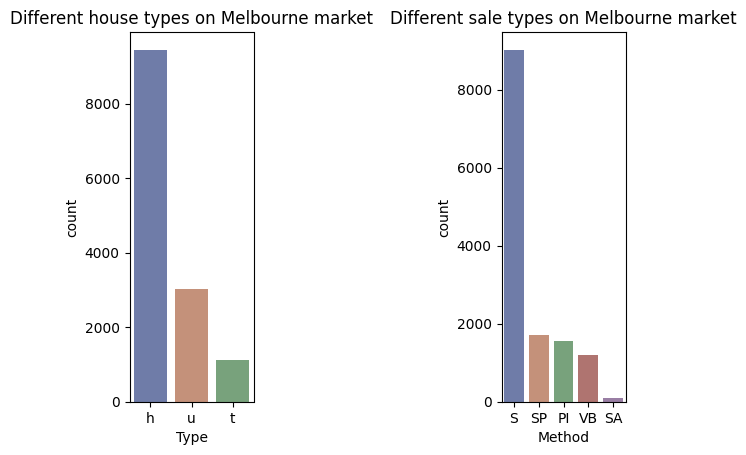

In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2)
sns.countplot(
    data=df_house, 
    x="Type",
    # errorbar="sd", 
    palette="dark", 
    alpha=.6,
    ax=ax1
)
ax1.set_title('Different house types on Melbourne market')

sns.countplot(
    data=df_house, 
    x="Method",
    # errorbar="sd", 
    palette="dark", 
    alpha=.6,
    ax=ax2
)
ax2.set_title('Different sale types on Melbourne market')
plt.subplots_adjust(wspace=2)
plt.show()

# g.despine(left=True)
# g.set_axis_labels("", "Body mass (g)")
# g.legend.set_title("Different house type on Melbourne market")

#### For this housing dataset, we have totally 21 columns and 13580 row. It is a data of Melbourne housing sales within the year 2016-2017. The data contains basic information about houses.
### - Type: Property type.
#### T: townhouse 
#### U: unit
#### H:house.
### - Distance: Distance between Melbourne CBD and the property.
### - Address: Address for the property.
### - Postcode: Postcode for the property.
### - Suburb: Suburb for the property.
### - Latitude, Longitude: the geographic information for the property. 
### - Rooms, Bedroom2, Bathroom, Car: The number of rooms, bathrooms, and parking spaces provided in the property.
### - BuildingArea: building area
### - YearBuilt: Year of built.
### - Landsize: Land size.
### - CouncilArea: Council that the property belong to. 
### - Regionname: Region.
## It also includes sales information: 
### - Date: Date of sold. 
### - Price: price of sold.
### - SellerG: selling agent
### - Method: selling method.
####      S - property sold; 
####      SP - property sold prior; 
####      PI - property passed in; 
####      VB - vendor bid; 
####      SA - sold after auction; 
### - Propertycount: Property that still on the market for sale.

In [6]:
df_house.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [7]:
df_house.dtypes

Suburb            object
Address           object
Rooms              int64
Type              object
Price            float64
Method            object
SellerG           object
Date              object
Distance         float64
Postcode         float64
Bedroom2         float64
Bathroom         float64
Car              float64
Landsize         float64
BuildingArea     float64
YearBuilt        float64
CouncilArea       object
Lattitude        float64
Longtitude       float64
Regionname        object
Propertycount    float64
dtype: object

# Data Cleaning

## 1. Data Type Management

### Through preliminary observation of the data, we can identify some unusual means:
### 1. Postcode. which should be of type "object", but in the data, it appears as "float".
### 2. Bedroom number, bathroom number and car number, should be the same data type of 'rooms', but it shows 'float'.
### 3. Date. Should be datetime.
### 4. Year. Should be interger.
### All this data type need to be fixed to the correct data type.

### (1) Date

In [8]:
df_house['Date']  = df_house['Date'].str.zfill(10)

In [9]:
df_house['Date'] = df_house['Date'].apply(lambda x: datetime.strptime(x, "%d/%m/%Y"))

In [10]:
df_house['Date']

0       2016-12-03
1       2016-02-04
2       2017-03-04
3       2017-03-04
4       2016-06-04
           ...    
13575   2017-08-26
13576   2017-08-26
13577   2017-08-26
13578   2017-08-26
13579   2017-08-26
Name: Date, Length: 13580, dtype: datetime64[ns]

In [11]:
df_house['Date'].dtypes

dtype('<M8[ns]')

In [12]:
df_house

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,NaN,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,NaN,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,NaN,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,NaN,-37.85908,144.89299,Western Metropolitan,6380.0


## 2. Filling Missing Data

In [13]:
df_house.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

### In the df_house data, it do have different null values.
### Car space: 62
### Building Area: 6450
### Year of Built: 5375
### Council Area: 1369

## 2. After a basic research of the raw data, now we need to fill the missing data.

### 2.1 Car

In [14]:
df_house[df_house['Car'].isnull()]

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
12221,Ascot Vale,132 The Parade,3,h,985000.0,S,Brad,2017-09-03,4.3,3032.0,3.0,1.0,NaN,245.0,91.0,1945.0,NaN,-37.77215,144.91144,Western Metropolitan,6567.0
12247,Brunswick East,18 Ethel St,2,h,1023000.0,S,Domain,2017-09-03,4.0,3057.0,2.0,1.0,NaN,154.0,76.0,1890.0,NaN,-37.77221,144.97537,Northern Metropolitan,5533.0
12259,Clifton Hill,34 Fenwick St,3,h,1436000.0,S,Jellis,2017-09-03,3.6,3068.0,3.0,2.0,NaN,123.0,128.0,1990.0,NaN,-37.78888,145.00036,Northern Metropolitan,2954.0
12320,Glen Waverley,19 Diamond Av,3,h,1370000.0,S,Fletchers,2017-09-03,16.7,3150.0,3.0,1.0,NaN,652.0,NaN,NaN,NaN,-37.87170,145.17267,Eastern Metropolitan,15321.0
12362,Newport,11 Collingwood Rd,4,h,1180000.0,PI,Williams,2017-09-03,6.2,3015.0,4.0,1.0,NaN,545.0,NaN,NaN,NaN,-37.84399,144.89125,Western Metropolitan,5498.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13496,Moonee Ponds,46 Eglinton St,4,h,1525000.0,S,Nelson,2017-08-26,6.2,3039.0,4.0,3.0,NaN,233.0,NaN,NaN,NaN,-37.76884,144.91708,Western Metropolitan,6232.0
13508,North Melbourne,9 Erskine St,2,h,1080000.0,S,Jellis,2017-08-26,1.8,3051.0,2.0,1.0,NaN,100.0,67.0,1890.0,NaN,-37.79524,144.94642,Northern Metropolitan,6821.0
13522,Port Melbourne,201 Stokes St,2,h,1515000.0,SP,Marshall,2017-08-26,3.5,3207.0,2.0,2.0,NaN,197.0,NaN,NaN,NaN,-37.83754,144.93954,Southern Metropolitan,8648.0
13524,Prahran,17 Packington Pl,2,h,1365000.0,S,Jellis,2017-08-26,4.6,3181.0,2.0,1.0,NaN,206.0,100.0,1900.0,NaN,-37.85569,145.00522,Southern Metropolitan,7717.0


#### After doing the online reserch, we can realize that all the property information with null car spot, which is because they are 'Terrace house' and with no equipped parking space. We can fill the null value with 0.

In [16]:
df_house['Car'] = df_house['Car'].fillna(df_house[df_house['Car'].isnull()]['Car'] == 0)

### 2.2 Building Area. 

In [17]:
# pd.set_option('display.max_row', None)
df_house.loc[df_house['BuildingArea'].isnull()].head(10)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
5,Abbotsford,129 Charles St,2,h,941000.0,S,Jellis,2016-05-07,2.5,3067.0,2.0,1.0,0.0,181.0,NaN,NaN,Yarra,-37.8041,144.9953,Northern Metropolitan,4019.0
8,Abbotsford,6/241 Nicholson St,1,u,300000.0,S,Biggin,2016-10-08,2.5,3067.0,1.0,1.0,1.0,0.0,NaN,NaN,Yarra,-37.8008,144.9973,Northern Metropolitan,4019.0
10,Abbotsford,411/8 Grosvenor St,2,u,700000.0,VB,Jellis,2016-11-12,2.5,3067.0,2.0,2.0,1.0,0.0,NaN,NaN,Yarra,-37.8110,145.0067,Northern Metropolitan,4019.0
13,Abbotsford,45 William St,2,h,1172500.0,S,Biggin,2016-08-13,2.5,3067.0,2.0,1.0,1.0,195.0,NaN,NaN,Yarra,-37.8084,144.9973,Northern Metropolitan,4019.0
14,Abbotsford,7/20 Abbotsford St,1,u,441000.0,SP,Greg,2016-05-14,2.5,3067.0,1.0,1.0,1.0,0.0,NaN,NaN,Yarra,-37.8016,144.9988,Northern Metropolitan,4019.0
18,Abbotsford,196 Nicholson St,3,h,955000.0,S,Collins,2016-09-17,2.5,3067.0,3.0,1.0,0.0,183.0,NaN,NaN,Yarra,-37.8022,144.9975,Northern Metropolitan,4019.0
21,Abbotsford,13/11 Nicholson St,3,t,900000.0,S,Beller,2017-03-18,2.5,3067.0,3.0,2.0,2.0,0.0,NaN,2010.0,Yarra,-37.8093,144.9959,Northern Metropolitan,4019.0
26,Abbotsford,5/20 Abbotsford St,1,u,426000.0,SP,Greg,2016-08-22,2.5,3067.0,1.0,1.0,1.0,0.0,NaN,NaN,Yarra,-37.8016,144.9988,Northern Metropolitan,4019.0


In [150]:
## fill empty building area with 0
df_house['BuildingArea'].fillna(0, inplace=True)

In [151]:
df_house['BuildingArea'].isnull().sum()

0

### 2.3 CouncilArea


In [19]:
# pd.set_option('display.max_row', None)
df_house.loc[df_house['CouncilArea'].isnull()].head(10)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
7584,Brighton East,7 Roberts Ct,3,h,1270000.0,VB,Ray,2017-05-20,10.7,3187.0,3.0,1.0,3.0,724.0,NaN,NaN,NaN,-37.92910,145.02970,Southern Metropolitan,6938.0
10797,Reservoir,48 Crevelli St,3,h,526250.0,SP,Barry,2017-07-08,12.0,3073.0,3.0,1.0,1.0,308.0,NaN,NaN,NaN,-37.72828,145.03033,Northern Metropolitan,21650.0
12213,Aberfeldie,1 Alma St,4,h,1436000.0,S,Brad,2017-09-03,7.5,3040.0,4.0,3.0,3.0,511.0,187.0,1922.0,NaN,-37.75788,144.90487,Western Metropolitan,1543.0
12214,Albion,40 Ridley St,5,h,905000.0,S,hockingstuart,2017-09-03,10.5,3020.0,5.0,2.0,3.0,732.0,NaN,1925.0,NaN,-37.78345,144.82295,Western Metropolitan,2185.0
12215,Alphington,22 Harker St,4,h,1680000.0,S,Love,2017-09-03,5.7,3078.0,4.0,3.0,2.0,720.0,NaN,NaN,NaN,-37.77928,145.02993,Northern Metropolitan,2211.0
12216,Altona,86 Grieve Pde,3,h,913000.0,S,Greg,2017-09-03,11.0,3018.0,3.0,2.0,3.0,530.0,148.0,1985.0,NaN,-37.86140,144.81931,Western Metropolitan,5301.0
12217,Altona Meadows,96 Linden St,3,h,590000.0,PI,hockingstuart,2017-09-03,15.5,3028.0,3.0,1.0,2.0,459.0,NaN,NaN,NaN,-37.87063,144.77632,Western Metropolitan,7630.0
12218,Altona North,95 Marion St,3,h,1070000.0,PI,RT,2017-09-03,9.4,3025.0,3.0,1.0,3.0,693.0,134.0,1950.0,NaN,-37.83511,144.84905,Western Metropolitan,5132.0
12219,Armadale,121 Kooyong Rd,4,h,5100000.0,S,Marshall,2017-09-03,6.3,3143.0,4.0,2.0,2.0,761.0,255.0,1900.0,NaN,-37.85249,145.02091,Southern Metropolitan,4836.0
12220,Armadale,2/26 Mercer Rd,2,u,820000.0,S,Jellis,2017-09-03,6.3,3143.0,2.0,1.0,1.0,1501.0,NaN,NaN,NaN,-37.85280,145.02684,Southern Metropolitan,4836.0


#### Through doing research about the raw, we first use the existing value to fill the council data

In [20]:
council_null = df_house[df_house['CouncilArea'].isnull()]['Suburb']
council_null.head(20)

7584      Brighton East
10797         Reservoir
12213        Aberfeldie
12214            Albion
12215        Alphington
12216            Altona
12217    Altona Meadows
12218      Altona North
12219          Armadale
12220          Armadale
12221        Ascot Vale
12222         Balaclava
12223      Balwyn North
12224      Balwyn North
12225      Balwyn North
12226      Balwyn North
12227         Bayswater
12228    Bentleigh East
12229    Bentleigh East
12230    Bentleigh East
Name: Suburb, dtype: object

In [21]:
council_not_null = df_house[~df_house['CouncilArea'].isnull()][['Suburb','CouncilArea']]
council_not_null.head(20)

,Suburb,CouncilArea
0,Abbotsford,Yarra
1,Abbotsford,Yarra
2,Abbotsford,Yarra
3,Abbotsford,Yarra
4,Abbotsford,Yarra
5,Abbotsford,Yarra
6,Abbotsford,Yarra
7,Abbotsford,Yarra
8,Abbotsford,Yarra
9,Abbotsford,Yarra


In [22]:
#Find council name from the exist row
def find_council(x):
    # print(x)
    suburb = x.strip()
    suburb_with_council = council_not_null[council_not_null['Suburb'] == x].reset_index(drop=True)
    if len(suburb_with_council) == 0:
        return 'unknown'
    else:
        # print(suburb_with_council)
        return suburb_with_council['CouncilArea'][0]
        

In [23]:
find_council('Abbotsford')

'Yarra'

In [24]:
# council_not_null[council_not_null['Suburb'] == 'Brighton East']   
df_house.loc[df_house['CouncilArea'].isnull(), 'CouncilArea'] = df_house[df_house['CouncilArea'].isnull()]['Suburb'].apply(find_council)
df_house

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0


#### After applying the function, we onlu have 7 suburb couldn't find existing data. we need to manually add their council name.

In [129]:
df_house.loc[df_house['CouncilArea'] == 'unknown']

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
12251,Burnside,22 Paringa Wy,3,h,657500.0,SP,Harcourts,2017-09-03,14.8,3023.0,3.0,2.0,2.0,631.0,NaN,NaN,unknown,-37.75225,144.75520,Western Metropolitan,1607.0,600-700
12438,Attwood,2 Herod Pl,3,h,640000.0,SP,YPA,2017-09-09,16.5,3049.0,3.0,2.0,2.0,607.0,NaN,NaN,unknown,-37.67379,144.89826,Northern Metropolitan,1130.0,600-700
12865,Wallan,14 Danaher Av,3,h,366000.0,S,Ray,2017-09-16,44.2,3756.0,3.0,1.0,1.0,502.0,77.0,1978.0,unknown,-37.40853,144.97749,Northern Victoria,3988.0,500-600
13245,New Gisborne,71 Hamilton Rd,5,h,1355000.0,S,Raine,2017-09-23,48.1,3438.0,5.0,3.0,5.0,44500.0,44515.0,NaN,unknown,-37.45392,144.58864,Northern Victoria,849.0,10000-50000
13264,Plumpton,9 Remy Av,4,h,625500.0,SP,HAR,2017-09-23,23.8,3335.0,4.0,2.0,2.0,477.0,178.0,2012.0,unknown,-37.71429,144.72492,Western Metropolitan,1490.0,200-500
13381,Burnside,18 Fydler Av,3,h,580000.0,S,YPA,2017-08-26,14.8,3023.0,3.0,2.0,2.0,461.0,174.0,2000.0,unknown,-37.74518,144.74708,Western Metropolitan,1607.0,200-500
13494,Monbulk,21 David St,4,h,720000.0,SP,Fletchers,2017-08-26,34.1,3793.0,4.0,2.0,2.0,1611.0,NaN,NaN,unknown,-37.87931,145.41288,Eastern Victoria,1424.0,1000-2000


In [142]:
#Fill unknown value
def fill_council(x):
    if x['CouncilArea'] == 'unknown': 
        if (x['Suburb'] == 'Burnside') or (x['Suburb'] == 'Plumpton'):
            return 'Melton'
        elif x['Suburb'] == 'Attwood':
            return 'Hume'
        elif x['Suburb'] == 'Wallan':
            return 'Mitchell Shire'
        elif (x['Suburb'] == 'Plumpton') or (x['Suburb'] == 'New Gisborne'):
            return 'Macedon Ranges Shire'
        else:
            return 'Yarra Ranges Shire'
    return x['CouncilArea']

In [148]:
df_house['CouncilArea'] = df_house.apply(fill_council, axis=1)

#### Now no missing data in council columns.

### 2.4 YearBuilt

In [152]:
#fill emissing year built with 0
df_house['YearBuilt'].fillna(0, inplace=True)

In [153]:
df_house['YearBuilt'].isnull().sum()

0

# Use case

## 2.1. Property Location investigation

## In this section, we will provide a brief overview based on the geographic information of the data.

### 2.1.1 What is the distribution of Melbourne house from the dataset according to different house type?


<Axes: >

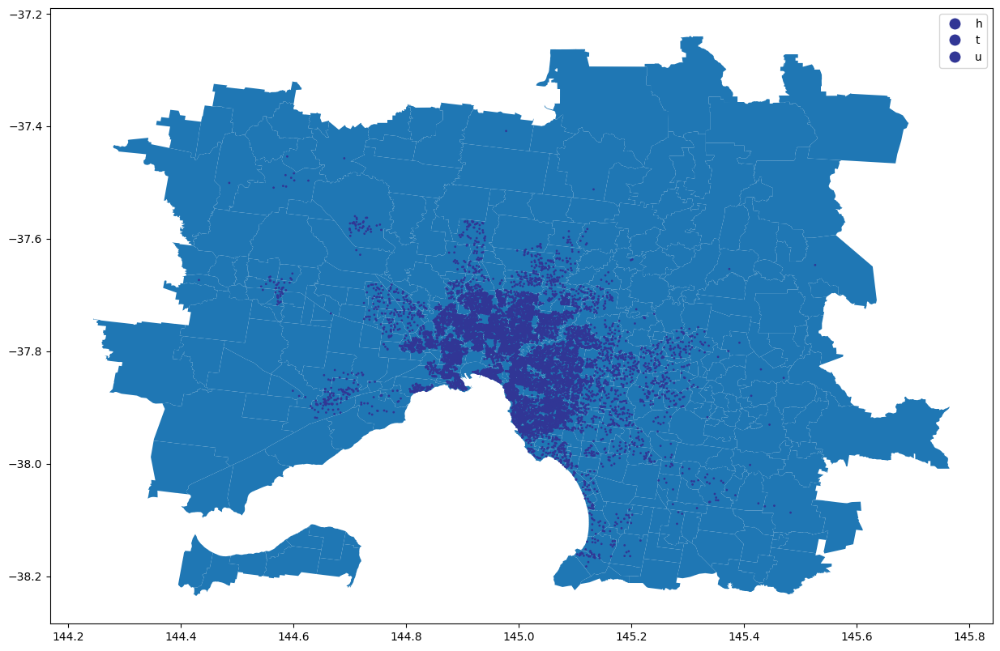

In [29]:
#plot all the property location
geometry = [Point(xy) for xy in zip(df_house['Longtitude'], df_house['Lattitude'])]
gdf = GeoDataFrame(df_house, geometry=geometry)  
#set boundaries
long_max = df_house['Longtitude'].max()
long_min = df_house['Longtitude'].min()
lat_max = df_house['Lattitude'].max()
lat_min = df_house['Lattitude'].min()
# read shapefile
victoria = gpd.read_file('/Users/vanessali/Desktop/Melbourne_house/vic_shape')
mel = victoria.cx[long_min:long_max, lat_min:lat_max]
gdf.plot(column='Type',  cmap='RdYlBu', legend=True, ax=mel.plot(figsize=(15, 11)), marker='o', markersize=1, vmin=-38, vmax=-37)

### This data mainly covers the Greater Melbourne area and a few regional areas. Next, we will explore the distribution of sold properties in the Greater Melbourne area using a heat map.

In [30]:
mel=gpd.read_file('suburb-10-vic.geojson')
mel

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,vic_loca_2,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry
0,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.1,6670,2011-08-31,NaN,VIC2615,2012-04-27,NaN,UNDERBOOL,NaN,NaN,G,NaN,2,"POLYGON ((141.74552 -35.07229, 141.74552 -35.0..."
1,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2,6671,2011-08-31,NaN,VIC1986,2012-04-27,NaN,NURRAN,NaN,NaN,G,NaN,2,"POLYGON ((148.66877 -37.39571, 148.66767 -37.3..."
2,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.3,6672,2011-08-31,NaN,VIC2862,2012-04-27,NaN,WOORNDOO,NaN,NaN,G,NaN,2,"POLYGON ((142.92288 -37.97886, 142.85448 -37.9..."
3,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.4,6673,2011-08-31,NaN,VIC734,2017-08-09,NaN,DEPTFORD,NaN,NaN,G,NaN,2,"POLYGON ((147.82336 -37.66001, 147.72499 -37.6..."
4,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.5,6674,2011-08-31,NaN,VIC2900,2012-04-27,NaN,YANAC,NaN,NaN,G,NaN,2,"POLYGON ((141.27978 -35.99859, 141.28480 -35.9..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2969,10667,2017-06-02,NaN,VIC1635,2017-08-09,NaN,MELBOURNE AIRPORT,NaN,NaN,G,NaN,2,"POLYGON ((144.86758 -37.67103, 144.86630 -37.6..."
2969,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2970,10666,2017-06-02,NaN,VIC381,2017-08-09,NaN,BULLA,NaN,NaN,G,NaN,2,"POLYGON ((144.80472 -37.66949, 144.80353 -37.6..."
2970,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2971,10688,2017-06-02,NaN,VIC2308,2017-08-09,NaN,SOMERS,NaN,NaN,G,NaN,2,"POLYGON ((145.19240 -38.40087, 145.18947 -38.4..."
2971,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2972,10687,2017-06-02,NaN,VIC1187,2017-08-09,NaN,HMAS CERBERUS,NaN,NaN,G,NaN,2,"POLYGON ((145.19240 -38.40087, 145.19624 -38.3..."


In [155]:
#property count by suburb
df_house_count = df_house.groupby('Suburb').size().reset_index(name='property_c')


In [33]:
df_house_count['Suburb'] = df_house_count['Suburb'].str.upper()
df_house_count

,Suburb,property_c
0,ABBOTSFORD,56
1,ABERFELDIE,44
2,AIRPORT WEST,67
3,ALBANVALE,6
4,ALBERT PARK,69
...,...,...
309,WONGA PARK,1
310,WYNDHAM VALE,4
311,YALLAMBIE,24
312,YARRA GLEN,1


In [34]:
mel_join=mel.merge(df_house_count, left_on='vic_loca_2', right_on='Suburb')

In [35]:
mel_join

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,vic_loca_2,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry,Suburb,property_c
0,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.31,9627,2012-08-17,NaN,VIC399,2012-10-29,NaN,BUNDOORA,NaN,NaN,G,NaN,2,"POLYGON ((145.02572 -37.71385, 145.02551 -37.7...",BUNDOORA,36
1,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.32,9628,2012-08-17,NaN,VIC1161,2012-10-29,NaN,HEIDELBERG WEST,NaN,NaN,G,NaN,2,"POLYGON ((145.03327 -37.74889, 145.03577 -37.7...",HEIDELBERG WEST,76
2,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.44,6584,2011-08-31,NaN,VIC2999,2012-04-27,NaN,DEEPDENE,NaN,NaN,G,NaN,2,"POLYGON ((145.06136 -37.80688, 145.07236 -37.8...",DEEPDENE,2
3,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.57,9757,2013-05-27,NaN,VIC683,2013-08-05,NaN,CROYDON SOUTH,NaN,NaN,G,NaN,2,"POLYGON ((145.29646 -37.81754, 145.29226 -37.8...",CROYDON SOUTH,1
4,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.60,9759,2013-05-27,NaN,VIC594,2013-08-05,NaN,COBURG NORTH,NaN,NaN,G,NaN,2,"POLYGON ((144.98314 -37.73598, 144.97689 -37.7...",COBURG NORTH,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2952,10267,2016-02-26,NaN,VIC2172,2016-05-05,NaN,RINGWOOD EAST,NaN,NaN,G,NaN,2,"POLYGON ((145.25589 -37.79656, 145.26064 -37.8...",RINGWOOD EAST,12
312,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2964,10669,2017-06-02,NaN,VIC1636,2017-08-09,NaN,MELTON,NaN,NaN,G,NaN,2,"POLYGON ((144.63751 -37.68113, 144.63616 -37.6...",MELTON,12
313,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2955,10274,2016-02-26,NaN,VIC2417,2016-05-05,NaN,SYDENHAM,NaN,NaN,G,NaN,2,"POLYGON ((144.75834 -37.68103, 144.76504 -37.6...",SYDENHAM,5
314,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2967,10638,2017-06-02,NaN,VIC499,2017-08-09,NaN,CAROLINE SPRINGS,NaN,NaN,G,NaN,2,"POLYGON ((144.74838 -37.75944, 144.74417 -37.7...",CAROLINE SPRINGS,11


(-38.0, -37.5)

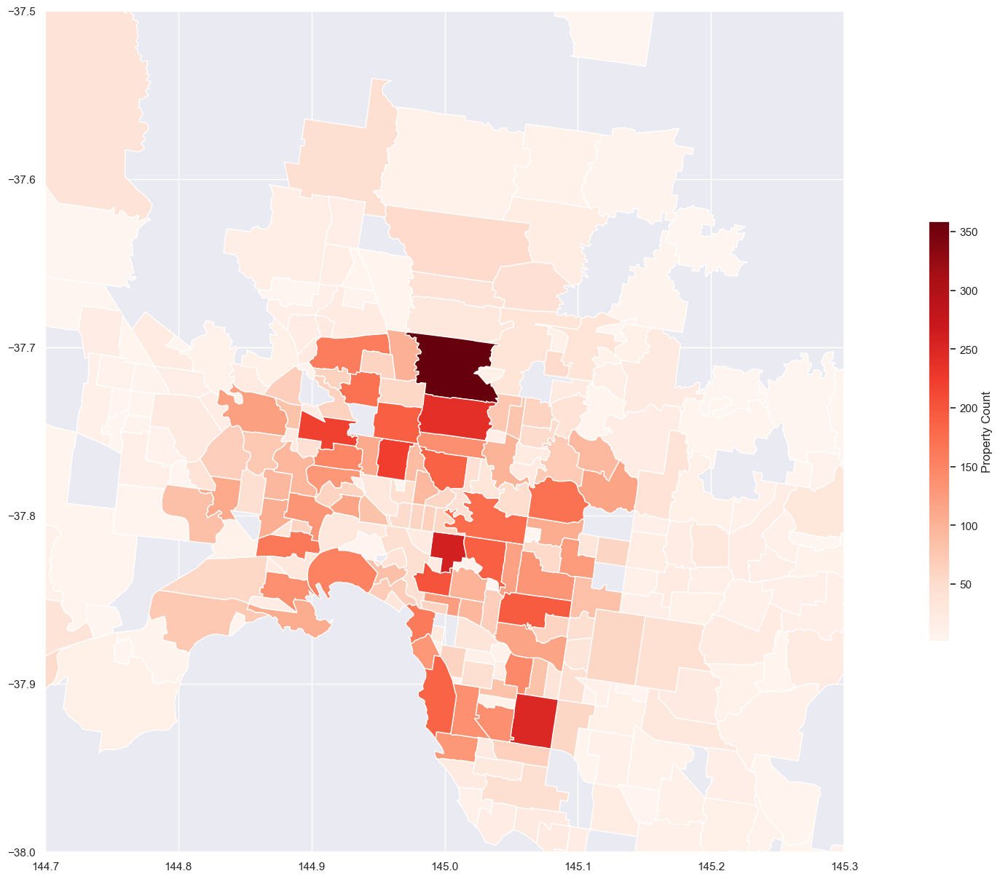

In [128]:
#Plot heat map
fig,ax = plt.subplots(figsize=(30, 15))
sns.set_palette('colorblind')
mel_join.plot(column='property_c', cmap='Reds', ax=ax, legend=True, legend_kwds={'label': 'Property Count', 'orientation': 'vertical', 'shrink': 0.5})
ax.set_xlim(144.7,145.3)
ax.set_ylim(-38, -37.5)

## Section overall

### From these two graphs, it can be observed that properties in Greater Melbourne are more popular. 

### In 2016-2017, the Northern region and the Southeastern region have recorded higher numbers of property sales. Specifically, Reservoir in the Northern region stands out with the highest number of property sales, reaching a staggering 359 properties.

## 2.2. Basic information Property

## To observe the basic information of this raw data, we will plot the distribution of room number, bathroom number and car spot number to have a better knowledge of the data. 

## Next, for the build year, we will plot a stacked bar char to know the distribution of different ages property in different suburbs.

In [38]:
df_house

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0


In [249]:
df_room_count = df_house.groupby(['Type','Rooms']).agg(room_count=('Rooms','count')).reset_index()
df_bathroom_count = df_house.groupby(['Type','Bathroom']).agg(bath_count=('Bathroom','count')).reset_index()
df_car_count = df_house.groupby(['Type','Car']).agg(car_count=('Car','count')).reset_index()


In [250]:
df_h_room=df_room_count.loc[df_room_count['Type']=='h']
df_t_room=df_room_count.loc[df_room_count['Type']=='t']
df_u_room=df_room_count.loc[df_room_count['Type']=='u']
df_h_broom=df_bathroom_count.loc[df_bathroom_count['Type']=='h']
df_t_broom=df_bathroom_count.loc[df_bathroom_count['Type']=='t']
df_u_broom=df_bathroom_count.loc[df_bathroom_count['Type']=='u']
df_h_car=df_car_count.loc[df_car_count['Type']=='h']
df_t_car=df_car_count.loc[df_car_count['Type']=='t']
df_u_car=df_car_count.loc[df_car_count['Type']=='u']

In [251]:
fig = make_subplots(rows=1, cols=3, specs=[[{"type": "pie"}, {"type": "pie"},{"type": "pie"}]])
sns.set_palette('colorblind')
category_orders=[1,2,3,4,5,6,7,8,9,10]
fig.add_trace(go.Pie(labels=df_h_room['Rooms'], values=df_h_room['room_count'],title="room_house"), row=1, col=1)
fig.add_trace(go.Pie(labels=df_t_room['Rooms'], values=df_t_room['room_count'],title="room_townhouse"), row=1, col=2)
fig.add_trace(go.Pie(labels=df_u_room['Rooms'], values=df_u_room['room_count'],title="room_units"), row=1, col=3)
# fig = px.pie(df_h, values='room_count', names='Rooms',  ax=axes[0, 0])
fig.update_layout(title="The distribution of room number")
fig.show()

In [255]:
fig = make_subplots(rows=1, cols=3, specs=[[{"type": "pie"}, {"type": "pie"},{"type": "pie"}]])
sns.set_palette('colorblind')
fig.add_trace(go.Pie(labels=df_h_broom['Bathroom'], values=df_h_broom['bath_count'],title='Bathroom_house'), row=1, col=1)
fig.add_trace(go.Pie(labels=df_t_broom['Bathroom'], values=df_t_broom['bath_count'],title='Bathroom_townhouse'), row=1, col=2)
fig.add_trace(go.Pie(labels=df_u_broom['Bathroom'], values=df_u_broom['bath_count'],title='Bathroom_unit'), row=1, col=3)
fig.update_layout(title="The distribution of bathroom number")
fig.show()

In [256]:
fig = make_subplots(rows=1, cols=3, specs=[[{"type": "pie"}, {"type": "pie"},{"type": "pie"}]])
sns.set_palette('colorblind')
fig.add_trace(go.Pie(labels=df_h_car['Car'], values=df_h_car['car_count'],title='Carspot_house'), row=1, col=1)
fig.add_trace(go.Pie(labels=df_t_car['Car'], values=df_t_car['car_count'],title='Carspot_townhouse'), row=1, col=2)
fig.add_trace(go.Pie(labels=df_u_car['Car'], values=df_u_car['car_count'],title='Carspot_unit'), row=1, col=3)
fig.update_layout(title="The distribution of car space number")
fig.show()

### From the graph, we know:

### Bedroom: More than half of the houses and townhouses have 3 bedrooms. On the other hand, over 60% of the units only have 2 bedrooms. 

### Bathroom: Interestingly, townhouses have an average of 2 bathrooms, which is more than houses. On the other hand, over 90% of the units only have 1 bathroom.

### Car space: Around 50% of the house and town have 2 car spaces. 5% of the units have no car space.

### We want to know in different suburbs, the distribution of different construction years in different regions

In [45]:
df_house_region=df_house.loc[df_house['Regionname'].str.contains('Metropolitan')]

In [186]:
df_house_region = df_house_region[~(df_house_region['YearBuilt'] == 0)].dropna()

In [193]:
has_zero = (df_house_region['YearBuilt'] == 0).any().any()

In [194]:
has_zero

False

In [195]:
#make category for yearbuilt
bins = [1100,1900,1930,1950,1970,1990,2010,2030]
group_order = bins
df_house_region['YearBuilt_category'] = pd.cut(df_house_region['YearBuilt'], bins)
df_house_region['YearBuilt_category'] = df_house_region['YearBuilt_category'].astype(str)
df_house_region

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,"(2010, 2030]"
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]"
9,Abbotsford,10 Valiant St,2,h,1097000.0,S,Biggin,2016-10-08,2.5,3067.0,3.0,1.0,2.0,220.0,75.0,1900.0,Yarra,-37.80100,144.99890,Northern Metropolitan,4019.0,"(1100, 1900]"
11,Abbotsford,40 Nicholson St,3,h,1350000.0,VB,Nelson,2016-11-12,2.5,3067.0,3.0,2.0,2.0,214.0,190.0,2005.0,Yarra,-37.80850,144.99640,Northern Metropolitan,4019.0,"(1990, 2010]"
15,Abbotsford,16 William St,2,h,1310000.0,S,Jellis,2016-10-15,2.5,3067.0,2.0,1.0,2.0,238.0,97.0,1890.0,Yarra,-37.80900,144.99760,Northern Metropolitan,4019.0,"(1100, 1900]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13572,Watsonia,76 Kenmare St,2,h,650000.0,PI,Morrison,2017-08-26,14.5,3087.0,2.0,1.0,1.0,210.0,79.0,2006.0,Banyule,-37.70657,145.07878,Northern Metropolitan,2329.0,"(1990, 2010]"
13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,"(1970, 1990]"
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]"
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]"


In [196]:
#groupby and know the number for each year category in each region and suburb
df_house_region_agg = df_house_region.groupby(['Regionname','Suburb','YearBuilt_category']).agg(year_built_count = ('YearBuilt_category','count')).reset_index()

In [197]:
# pd.set_option('display.max_rows', None) 
df_house_region_agg

,Regionname,Suburb,YearBuilt_category,year_built_count
0,Eastern Metropolitan,Bayswater,"(1950, 1970]",5
1,Eastern Metropolitan,Bayswater,"(1970, 1990]",4
2,Eastern Metropolitan,Bayswater,"(1990, 2010]",1
3,Eastern Metropolitan,Bayswater North,"(1970, 1990]",3
4,Eastern Metropolitan,Bellfield,"(1930, 1950]",3
...,...,...,...,...
1023,Western Metropolitan,Yarraville,"(1930, 1950]",16
1024,Western Metropolitan,Yarraville,"(1950, 1970]",13
1025,Western Metropolitan,Yarraville,"(1970, 1990]",2
1026,Western Metropolitan,Yarraville,"(1990, 2010]",9


In [198]:
# Plot stacked bar chart
def get_plot(i):
    # print(i)
    #plot
    sns.set_palette("pastel")
    sns.set(rc={'figure.figsize':(16,8.27)})
    i.set_index('Suburb').plot(kind='bar', stacked=True)

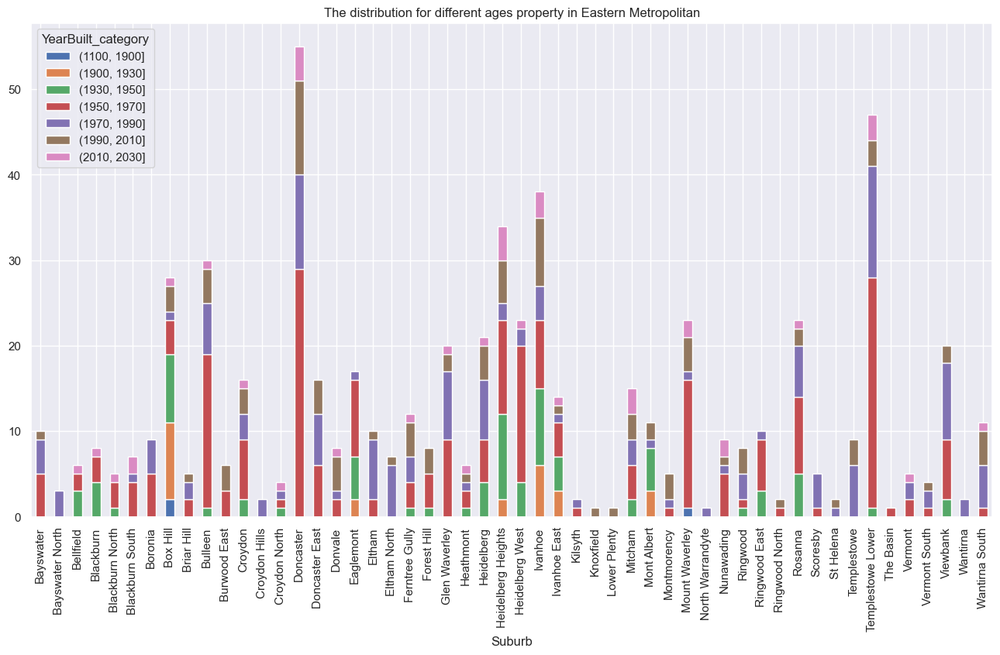

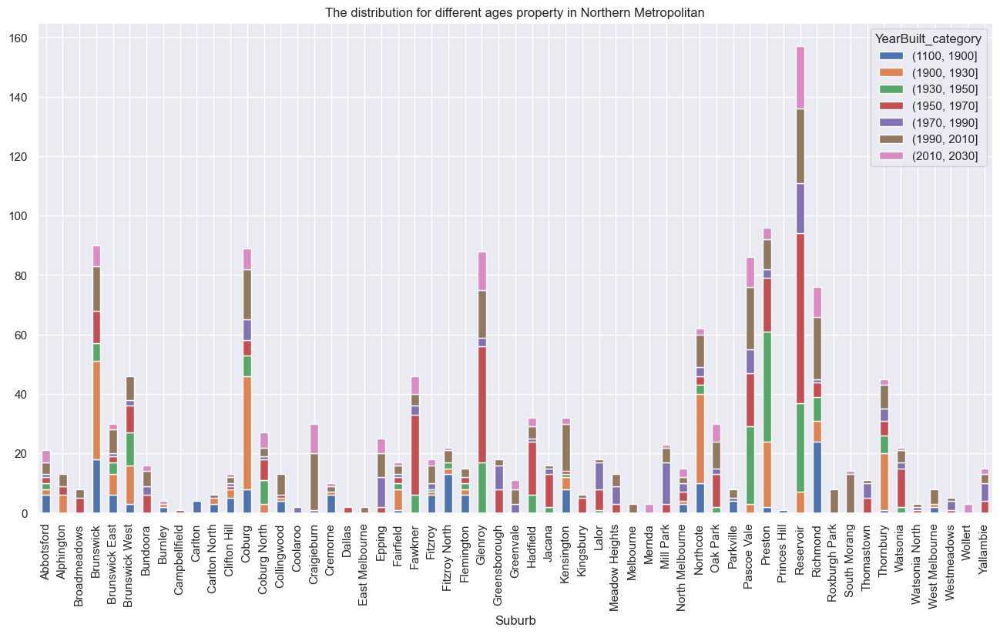

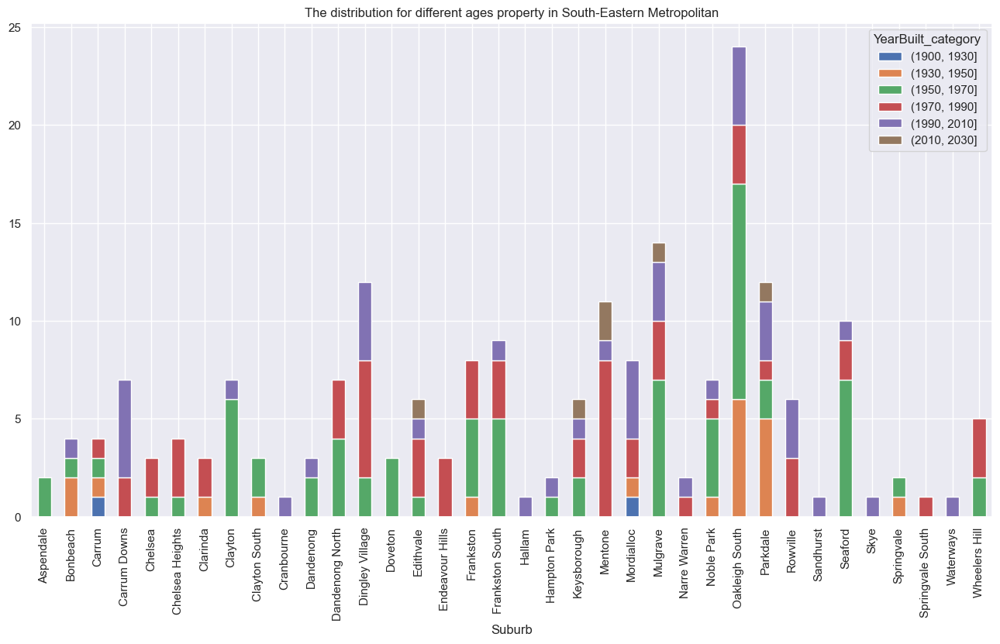

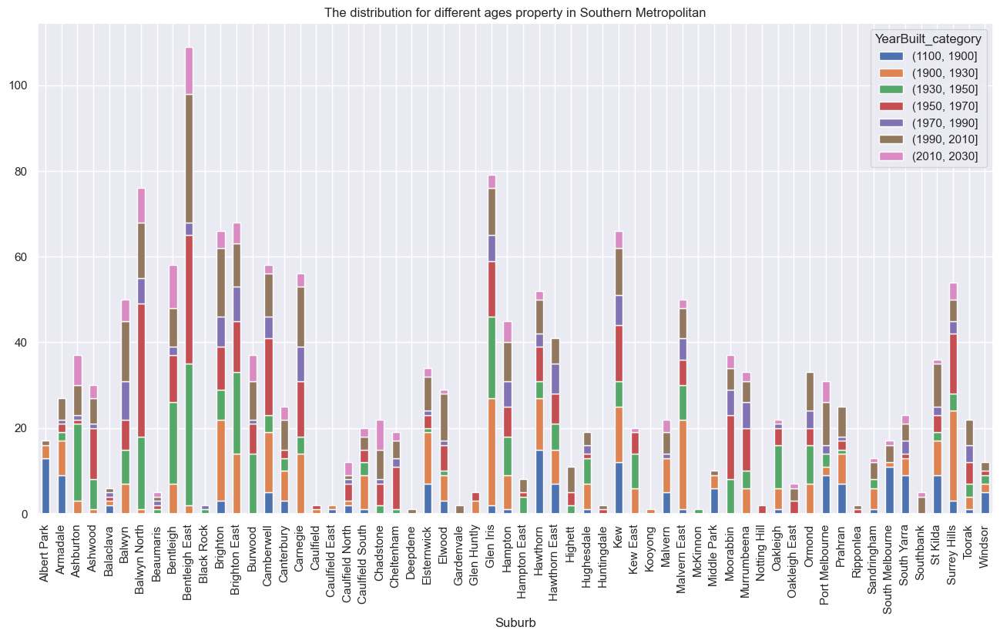

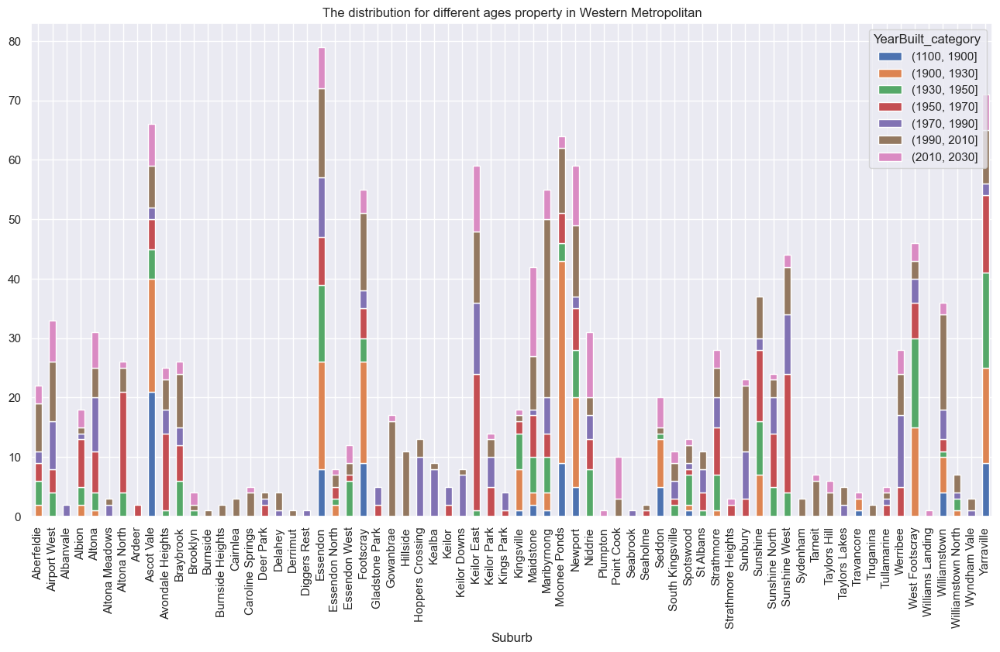

In [199]:
# Plot each region 
for i in df_house_region_agg['Regionname'].unique():
    distribution = df_house_region_agg.loc[df_house_region_agg['Regionname'] == i]
    pivot_df = distribution.pivot_table(index='Suburb', columns='YearBuilt_category', values='year_built_count')
    df_filled = pivot_df.fillna(0)
    # df_filled['total'] = df_filled.sum(axis=1)
    df_filled = df_filled.reset_index()
    #run methon
    get_plot(df_filled)
    plt.title('The distribution for different ages property in ' + i)

### Due to the large amount of data, we can only get a rough idea of the age distribution of Melbourne houses。
### 1. Among all regions, the highest number of houses was built between 1950 and 1970. However, the second-ranked period varies across different regions。
### 2. In Eastern, South-Eastern and Southern Metropolitan，properties tend to be older, with the majority of them being built between 1930 and 1990.
### 3. In the rest regions, they have more properties that were built after 2000.

### To conduct a more detailed analysis of the age of houses in each region, we will compare the top 15 suburbs in terms of the number of houses in each region.

In [176]:
df_house_region

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,"(1100, 1900]"
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,"(1100, 1900]"
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,"(2010, 2030]"
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.80240,144.99930,Northern Metropolitan,4019.0,"(1900, 1930]"
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,"(1970, 1990]"
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]"
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0,"(1990, 2010]"
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]"


In [ ]:
# def get_plot_stackedand_pie(i):
#     fig, axes = plt.subplots(1, 2)
    
#     sns.set_palette("pastel")
#     sns.set(rc={'figure.figsize':(16,8.27)})
#     i.set_index('Suburb').plot(kind='bar', stacked=True)
    

In [227]:
# get_top15_builtyear, and plot
def get_top_10_suburb_andplot(x):
    df_house_group_new = df_house_region.loc[df_house_region['Regionname'] == x].groupby(['Regionname', 'Suburb']).agg(year_built_count=('Type','count')).reset_index()
    sorted_df_top_15 = df_house_group_new.sort_values('year_built_count', ascending=False).head(15)
    top_15_suburb = list(sorted_df_top_15['Suburb'])
    top_15 = df_house_region[df_house_region['Suburb'].isin(top_15_suburb)].reset_index()
    df_top_15_newgroup = top_15.groupby(['Regionname','Suburb','YearBuilt_category']).agg(year_built_count = ('YearBuilt_category','count')).reset_index()
    # print(df_top_15_newgroup)

    #plot stacked bar char
    for i in df_top_15_newgroup['Regionname'].unique():
        distribution = df_top_15_newgroup.loc[df_top_15_newgroup['Regionname'] == i]
        pivot_df = distribution.pivot_table(index='Suburb', columns='YearBuilt_category', values='year_built_count')
        df_filled = pivot_df.fillna(0)
        # df_filled['total'] = df_filled.sum(axis=1)
        df_filled = df_filled.reset_index()
        #run methon
        get_plot(df_filled)
        plt.title('The distribution for different ages property in ' + i)

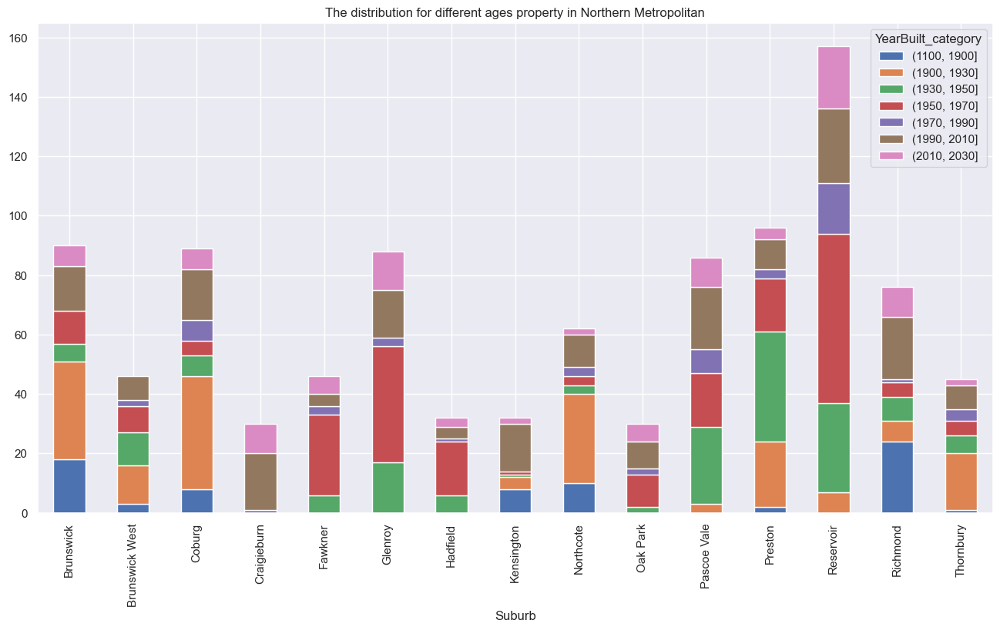

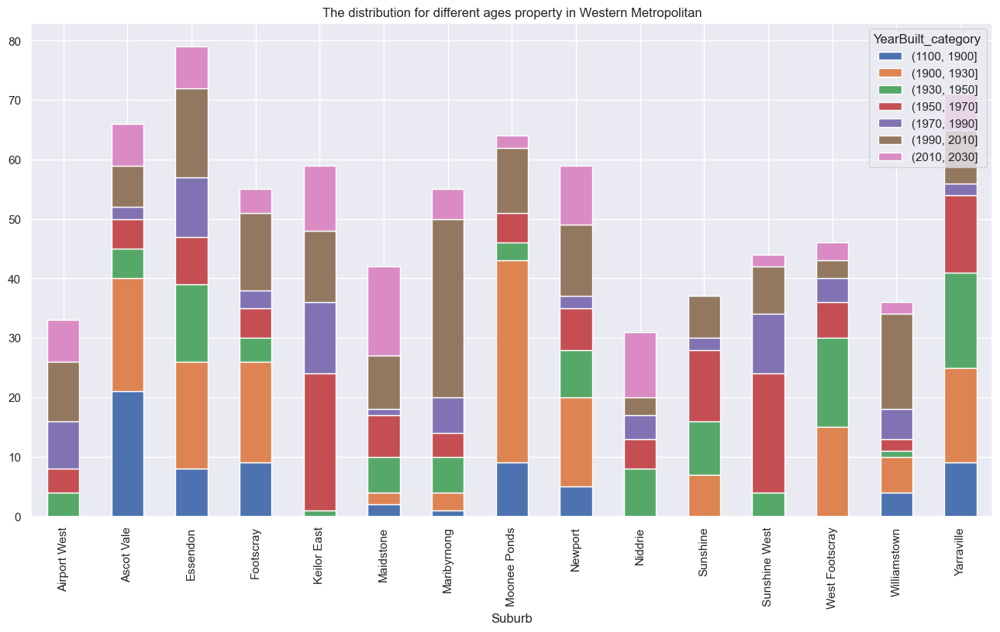

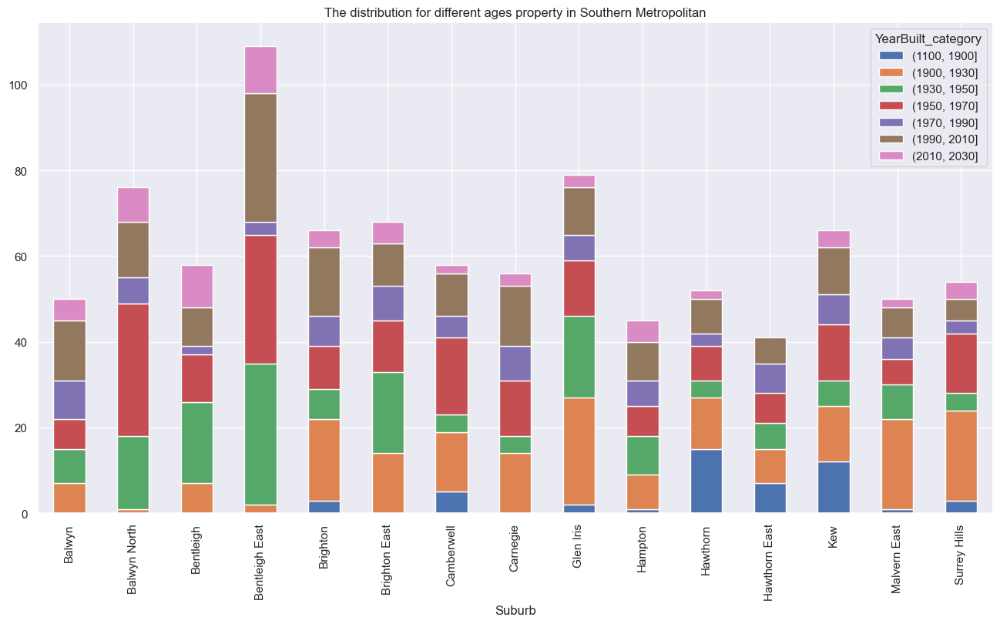

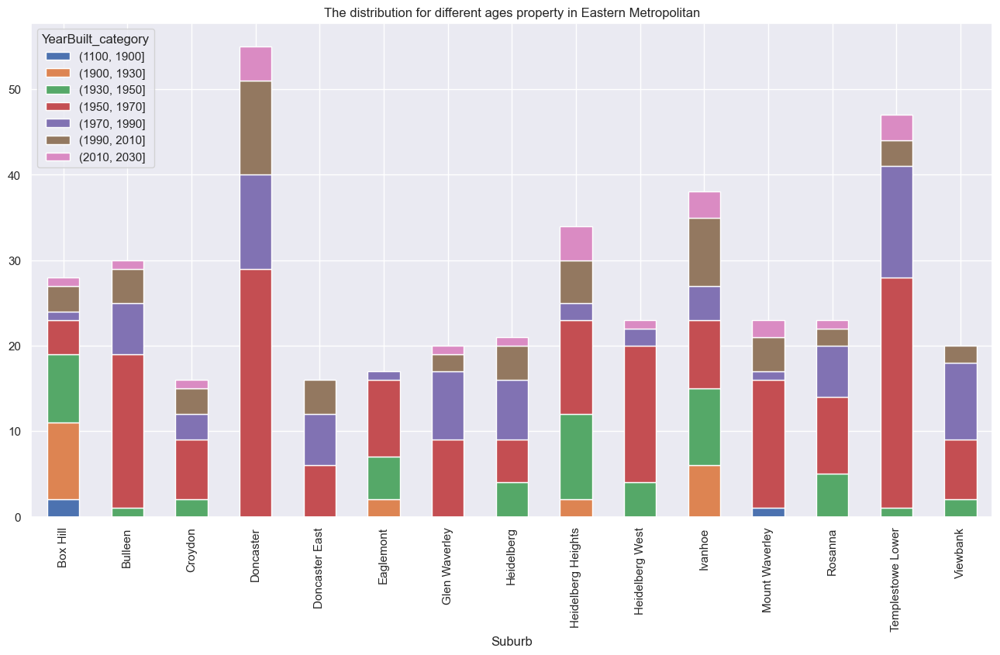

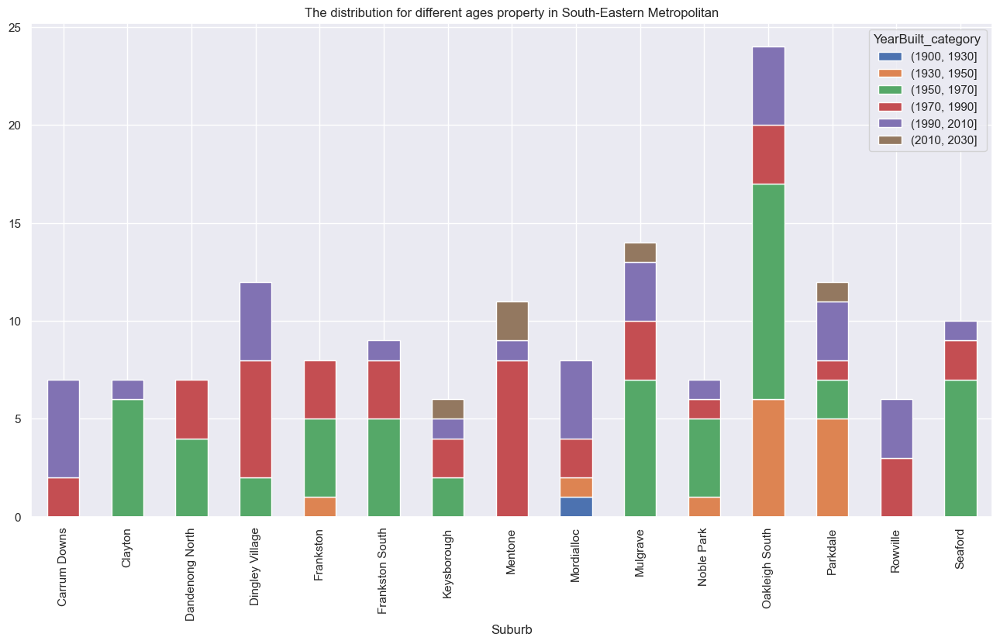

In [228]:
for i in df_house_region['Regionname'].unique():
    get_top_10_suburb_andplot(i)

## Section Overall

## 2.3 Price

## In this section, we will focus on the most important feature in real estate: price. When comes to purchasing real estate, people are always most concerned about the price of the property. The main focus of this report is to explore which factors directly influence property prices.

### 2.3.1 Distance

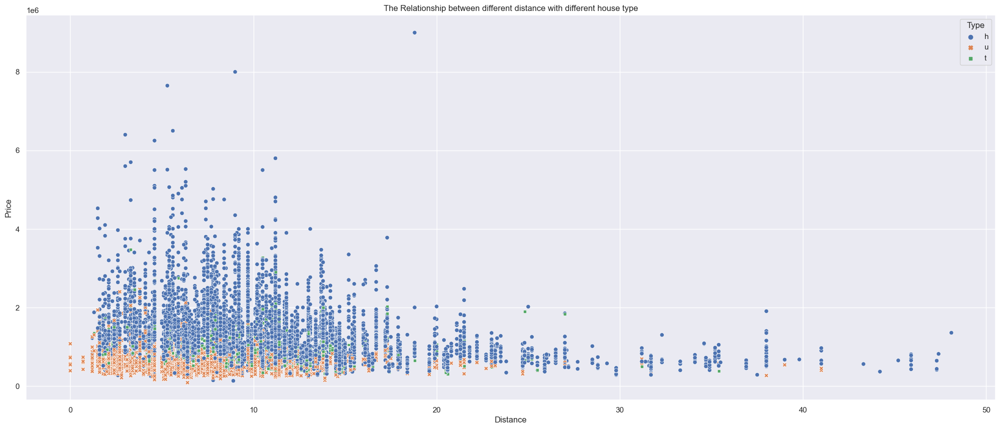

In [52]:
fig, ax = plt.subplots(figsize=(25,10))
sns.scatterplot(data=df_house, x="Distance", y="Price",hue="Type", style="Type",legend=True)   
plt.title('The Relationship between different distance with different house type')
plt.show()

#### This figure didn't not illustrate the relation between distance from the CBD and house prices very well, as they do not have a linear relationship. For example, within the 5-10km range, the prices of different houses is vary huge, ranging from 1.5 million to 9 million. The information that can be inferred from this figure is most people prefer to choose houses within 20km of the city central, and there is a significant price difference between townhouses, units, and houses. House is much expensive than the others.

### For gaining a more comprehensive understanding, we need to consider additional factors:


#### (1) Region

In [53]:
median_prices = df_house.groupby(['Regionname', 'Type']).agg({'Price':np.median})
df_median_prices = pd.DataFrame(median_prices).reset_index()

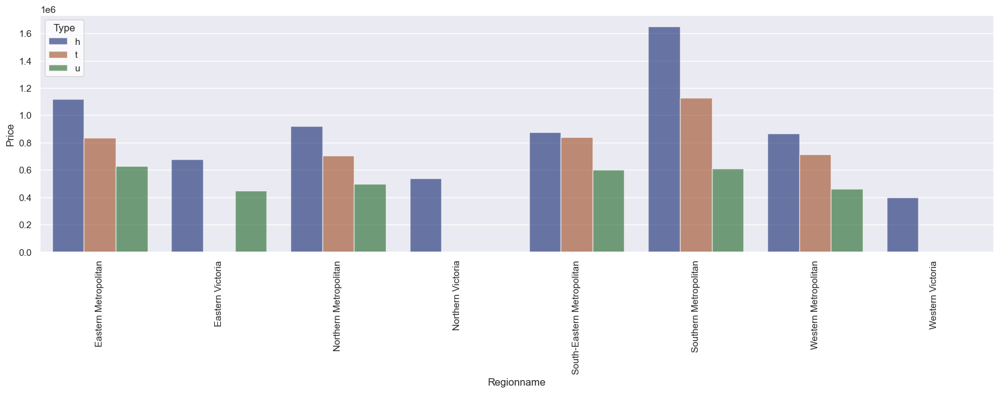

In [54]:
##region
fig, ax = plt.subplots(figsize=(20,5))
sns.set_theme(style="whitegrid")
sns.barplot(x='Regionname',y='Price',
            data=df_median_prices, 
            hue='Type',
            errorbar="sd", 
            palette="dark", 
            alpha=.6,ax=ax) 
            # height=6, aspect=2)
plt.xticks(rotation=90)
# ax.legend.set_title("House Type")
# ax.set_title('Relationship between Region and Price')
plt.show()


#### Region+Suburb+Distance

In [55]:
##region+suburb
df_region_sub_price = df_house.groupby(['Regionname', 'Suburb','Type']).agg({'Distance': np.median, 'Price': np.median}).reset_index()
bins = [0, 10, 20, 30, 40, 50]
df_region_sub_price['Dis_category'] = pd.cut(df_region_sub_price['Distance'], bins)
df_region_sub_price

,Regionname,Suburb,Type,Distance,Price,Dis_category
0,Eastern Metropolitan,Bayswater,h,23.2,789500.0,"(20, 30]"
1,Eastern Metropolitan,Bayswater,t,23.2,750000.0,"(20, 30]"
2,Eastern Metropolitan,Bayswater,u,23.2,520000.0,"(20, 30]"
3,Eastern Metropolitan,Bayswater North,h,23.2,743000.0,"(20, 30]"
4,Eastern Metropolitan,Bayswater North,u,23.2,600000.0,"(20, 30]"
...,...,...,...,...,...,...
685,Western Metropolitan,Yarraville,u,7.0,460250.0,"(0, 10]"
686,Western Victoria,Bacchus Marsh,h,37.5,285000.0,"(30, 40]"
687,Western Victoria,Brookfield,h,29.8,456000.0,"(20, 30]"
688,Western Victoria,Melton,h,31.7,412500.0,"(30, 40]"


In [56]:
def makeplot_disprice(x):
    # fig, ax = plt.subplots(figsize=(25,10))
    sns.relplot(x='Suburb', 
                y='Price', 
                data=x, 
                hue="Dis_category", size="Dis_category", sizes=(20, 200), legend="full", row='Type', alpha=.5, height=3, aspect=6).set(title=i)
    plt.xticks(rotation=90)
    plt.show()

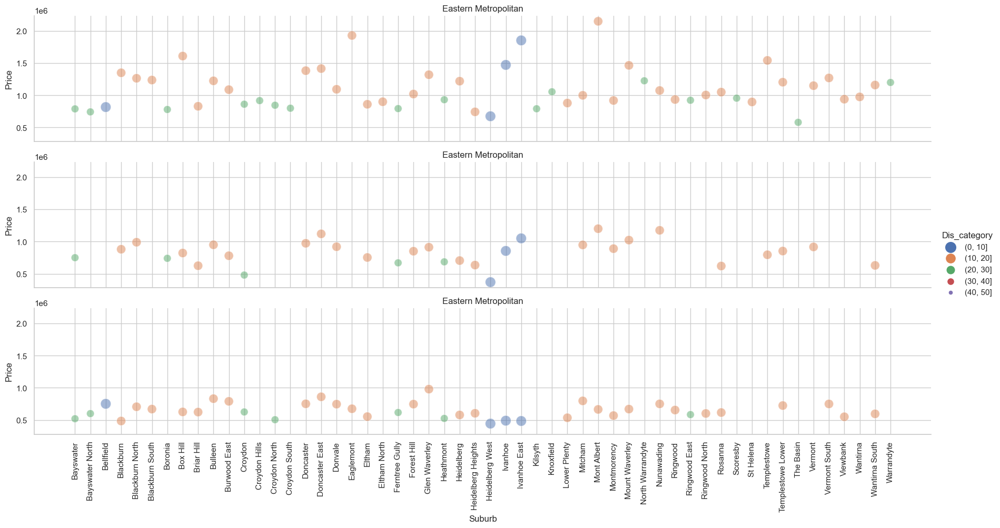

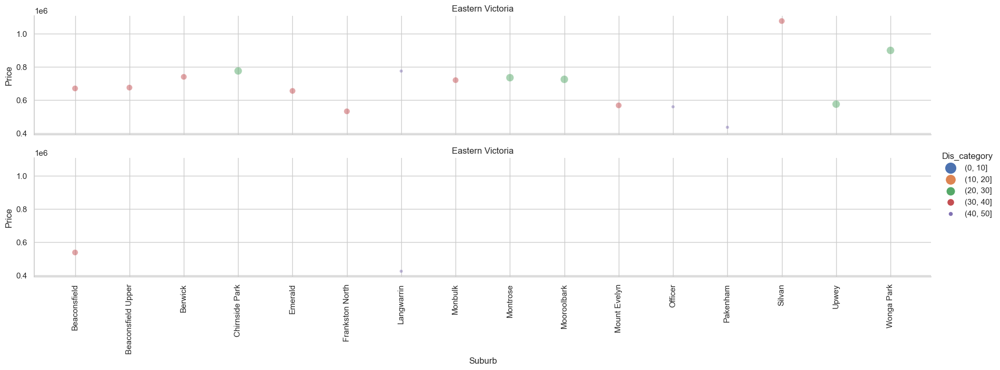

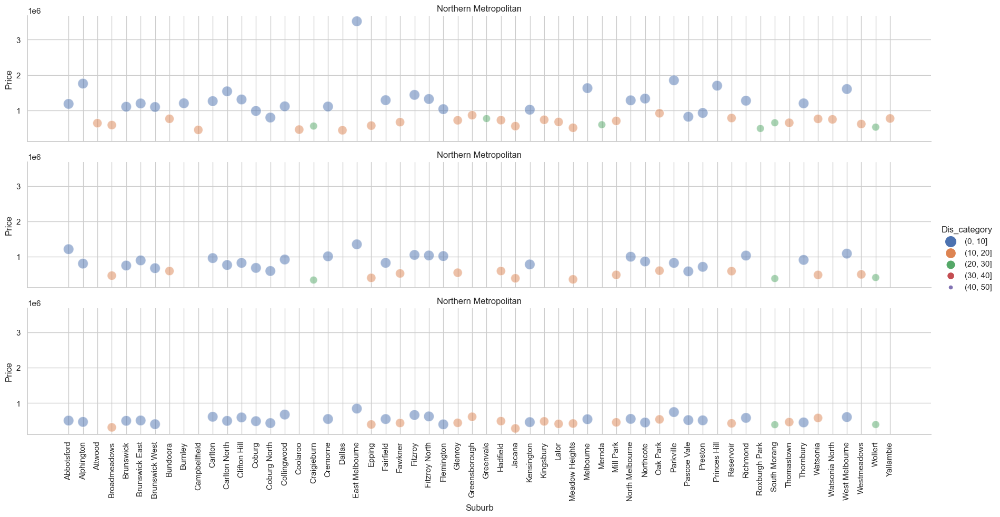

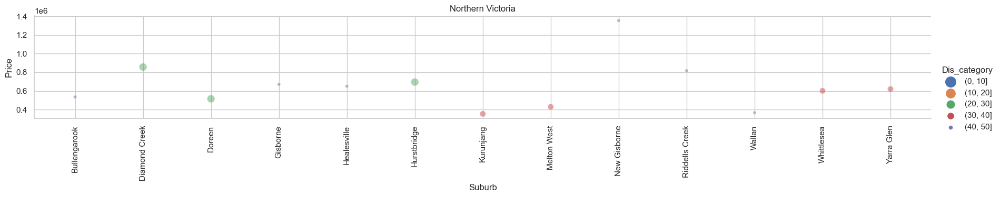

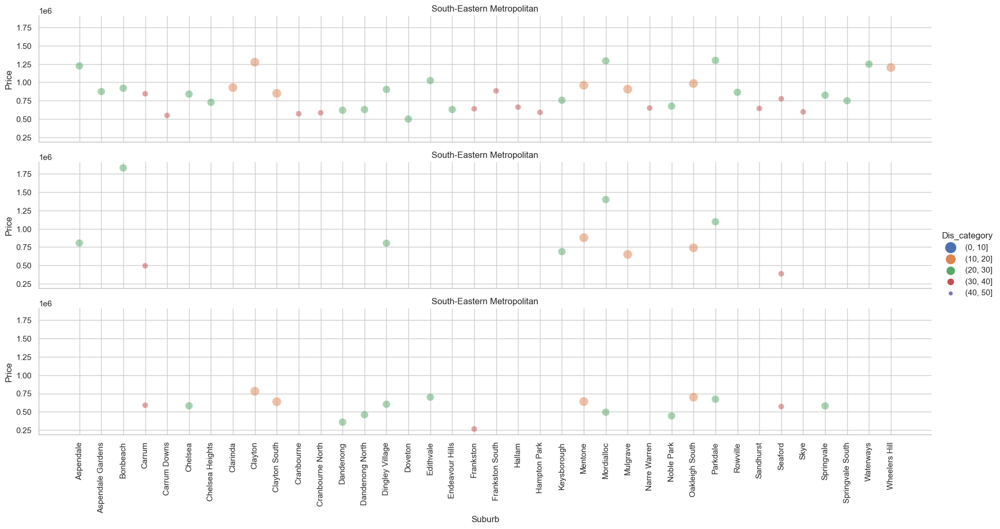

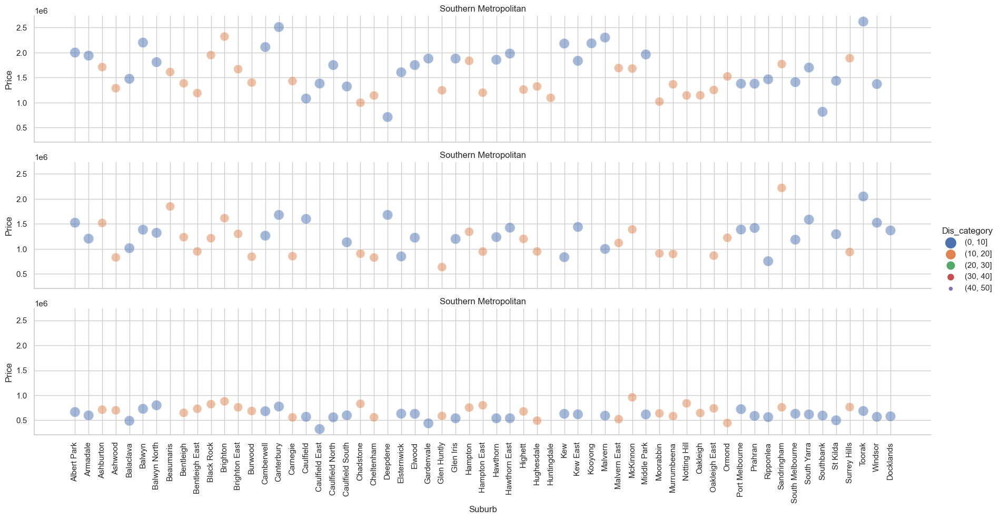

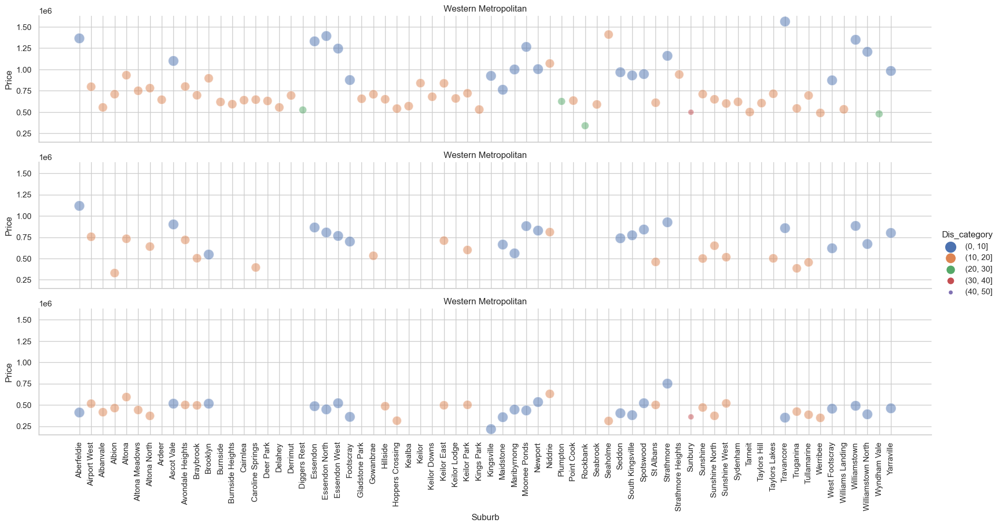

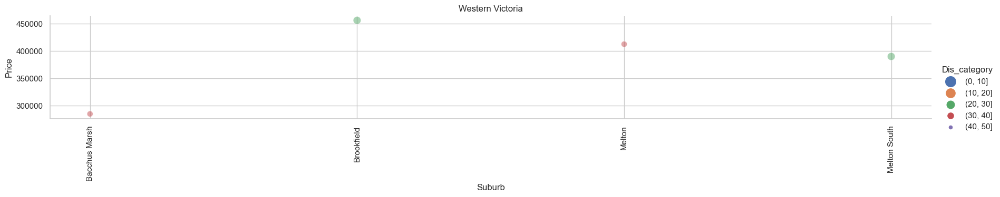

In [57]:
for i in df_region_sub_price['Regionname'].unique():
     makeplot_disprice(df_region_sub_price[df_region_sub_price['Regionname'] == i])


### After extracting the median prices for different house types in each region and suburb, we found that:

### 1. The distance to the CBD does not have a significant impact on house prices when the distance is within 20 kilometers. However, for properties located more than 30 kilometers away from the CBD, the prices are lower compared to the former. Among the four factors we have studied (region, suburb, distance, and house type), suburb and house type are the top two factors influencing house prices. From the figure, we can observe that in each suburb, the price ranking is as follows: house, townhouse, unit. 

### 2. Regarding the region, we can see that the highest prices are found in the Southern Metropolitan region. The suburbs with an average house price ranging from 2 to 2.5 million dollars in this region include Camberwell, Canterbury, Kew, Kooyong, Malvern, and Toorak. This demonstrates that even within the same region, different suburbs still exhibit significant price variations. 

### 3. The Northern Metropolitan and Western Metropolitan regions are the only two regions where most houses within a 10-kilometer radius perform better than those in the 10-20 kilometer range. Additionally, the average prices in these two regions are lower compared to the South and East regions, indicating that regions with lower average prices are more influenced by the distance from the CBD. Interestingly, the South-East Metropolitan region is the only area in Greater Melbourne where house prices are completely not affected by the distance to the CBD.

## Next, we will explore which suburbs have higher prices.

In [391]:
top_10_total = []

In [392]:
#get top 10 price suburb
for i in df_house['Regionname'].unique():
    df_house_group = df_house.loc[(df_house['Regionname'] == i)].groupby(['Regionname', 'Suburb','Type']).agg({'Price':np.median}).reset_index()
    sorted_df_top_10 = df_house_group.loc[df_house_group['Type'] == 'h'].sort_values('Price', ascending=False).head(10)
    top_10_suburb = list(sorted_df_top_10['Suburb'])
    top_10 = df_house[df_house['Suburb'].isin(top_10_suburb)].reset_index()
    top_10
    top_10_total.append(top_10)

In [393]:
merged_df = pd.concat(top_10_total, ignore_index=True)

In [396]:
merged_df

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group,CouncilArea1,sold_month
0,120,Alphington,6 Smith St,4,h,2000000.0,S,Brace,2016-09-03,6.4,3078.0,3.0,2.0,4.0,853.0,263.0,1930.0,Darebin,-37.77070,145.03180,Northern Metropolitan,2211.0,800-1000,Darebin,2016-09-01
1,121,Alphington,5/6 Yarralea St,3,h,1110000.0,S,Jellis,2016-09-03,6.4,3078.0,3.0,2.0,2.0,208.0,0.0,2013.0,Yarra,-37.78540,145.03250,Northern Metropolitan,2211.0,200-500,Yarra,2016-09-01
2,122,Alphington,136A Fulham Rd,3,h,1492000.0,S,Jellis,2017-03-04,6.4,3078.0,3.0,2.0,2.0,411.0,0.0,0.0,Darebin,-37.77130,145.02790,Northern Metropolitan,2211.0,200-500,Darebin,2017-03-01
3,123,Alphington,44 Shiers St,4,h,1717500.0,S,Collins,2016-10-08,6.4,3078.0,4.0,2.0,1.0,599.0,203.0,1925.0,Darebin,-37.77170,145.03100,Northern Metropolitan,2211.0,500-600,Darebin,2016-10-01
4,124,Alphington,83 Fulham Rd,5,h,2840000.0,S,Nelson,2016-06-12,6.4,3078.0,5.0,4.0,4.0,809.0,165.0,1910.0,Darebin,-37.77500,145.02680,Northern Metropolitan,2211.0,800-1000,Darebin,2016-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3012,12554,Melton South,71 Hume Av,4,h,410000.0,S,hockingstuart,2017-09-09,29.8,3338.0,4.0,1.0,2.0,578.0,104.0,1980.0,Melton,-37.71077,144.57198,Western Victoria,4718.0,500-600,Melton,2017-09-01
3013,13024,Melton South,18 Brennan St,3,h,460000.0,S,Ryder,2017-08-19,29.8,3338.0,3.0,1.0,1.0,602.0,108.0,1980.0,Melton,-37.70484,144.57261,Western Victoria,4718.0,600-700,Melton,2017-08-01
3014,13227,Melton,118 Barries Rd,3,h,283000.0,S,FN,2017-09-23,31.7,3337.0,3.0,1.0,0.0,362.0,19.0,1976.0,Melton,-37.68755,144.56887,Western Victoria,3600.0,200-500,Melton,2017-09-01
3015,13487,Melton,21D Yuille St,5,h,710000.0,PI,Ryder,2017-08-26,31.7,3337.0,5.0,2.0,2.0,1670.0,280.0,2000.0,Melton,-37.67813,144.59292,Western Victoria,3600.0,1000-2000,Melton,2017-08-01


In [402]:
merged_df_gourp = merged_df.loc[merged_df['Type'] == 'h'].groupby('Suburb').agg({'Price':np.median}).reset_index()

In [403]:
merged_df_gourp

,Suburb,Price
0,Aberfeldie,1365000.0
1,Albert Park,2000000.0
2,Alphington,1758750.0
3,Aspendale,1225000.0
4,Bacchus Marsh,285000.0
...,...,...
69,Whittlesea,601000.0
70,Williamstown,1348750.0
71,Williamstown North,1207500.0
72,Wonga Park,900000.0


In [404]:
merged_df_gourp['Suburb'] = merged_df_gourp['Suburb'].str.upper()

In [405]:
#plot high price heatmap
fig = px.choropleth_mapbox(merged_df_gourp, geojson=mel, locations='Suburb', color='Price',
                           color_continuous_scale="Viridis",
                           featureidkey="properties.vic_loca_2",
                           # range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=9, center = {"lat": -37.8, "lon": 145},
                           opacity=1,
                           labels={'Price':'Price'},
                           width=2000,
                           height=800)

# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## From this graph, we can see that within a distance of 20 kilometers from the CBD, prices are indeed relatively high. However, different suburbs within the same distance can still have different prices.

### 2.3.2 Room Number 

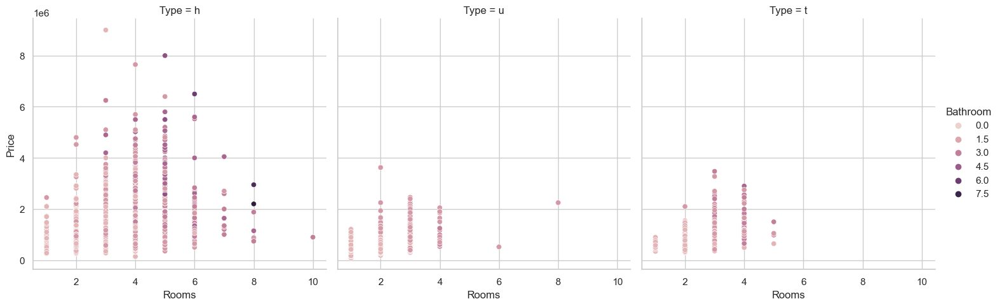

In [59]:
sns.relplot(x='Rooms',y='Price',data=df_house,kind='scatter',hue='Bathroom', col='Type',legend=True)

In [60]:
df_room_sub_price = df_house.groupby(['Regionname','Suburb','Type','Rooms']).agg({'Price':np.median}).reset_index()
df_room_sub_price

,Regionname,Suburb,Type,Rooms,Price
0,Eastern Metropolitan,Bayswater,h,3,720000.0
1,Eastern Metropolitan,Bayswater,h,4,925000.0
2,Eastern Metropolitan,Bayswater,h,5,915000.0
3,Eastern Metropolitan,Bayswater,t,3,640000.0
4,Eastern Metropolitan,Bayswater,t,4,860000.0
...,...,...,...,...,...
1752,Western Victoria,Melton,h,4,405000.0
1753,Western Victoria,Melton,h,5,585000.0
1754,Western Victoria,Melton South,h,2,280500.0
1755,Western Victoria,Melton South,h,3,395000.0


In [61]:
def get_pricerooms(x, i):
    fig, ax = plt.subplots(figsize=(30,5))
    sns.barplot(x='Suburb', y='Price', 
                data=x, 
                hue='Rooms', alpha=.5,errorbar=None).set(title=i)
    plt.xticks(rotation=90)
    plt.show()
    sns.set_theme(style="darkgrid")

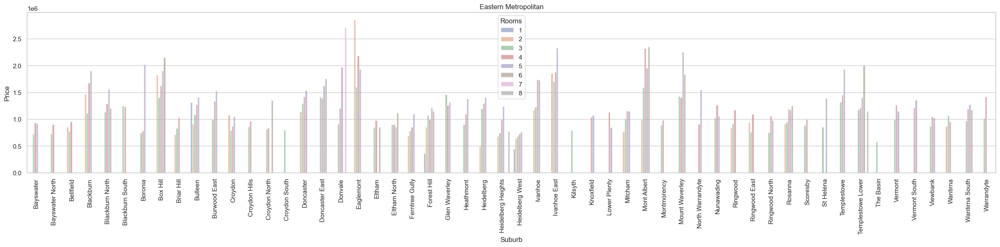

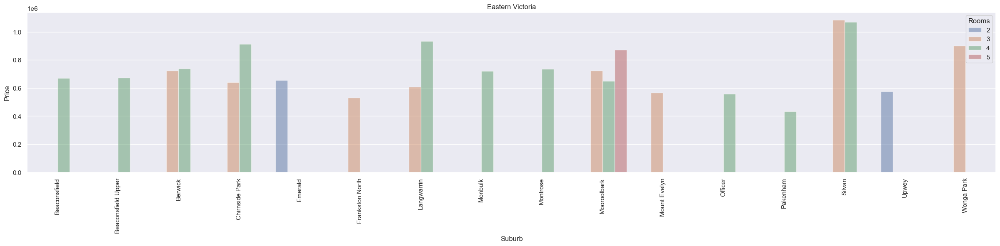

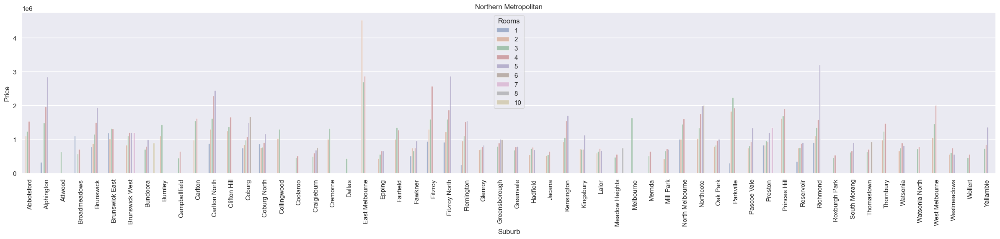

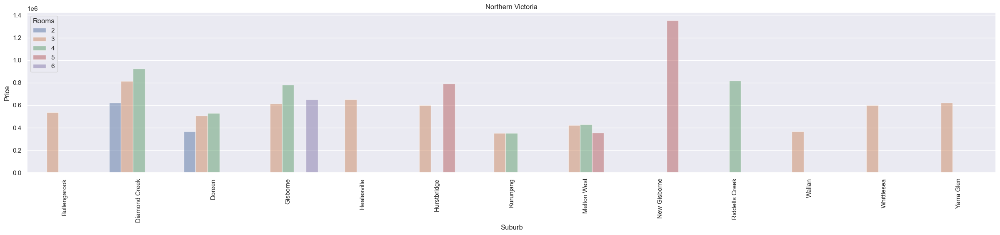

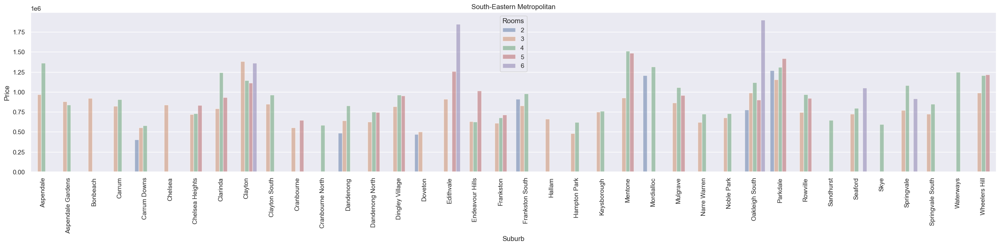

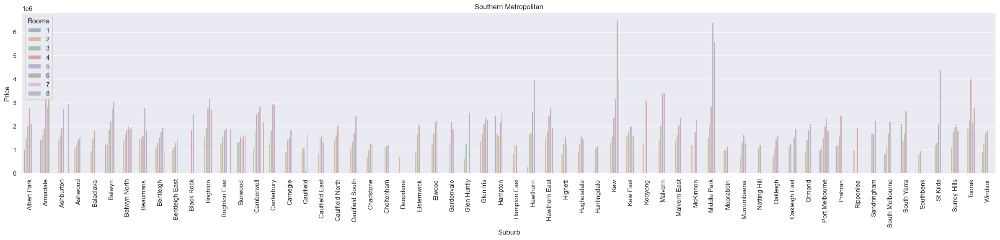

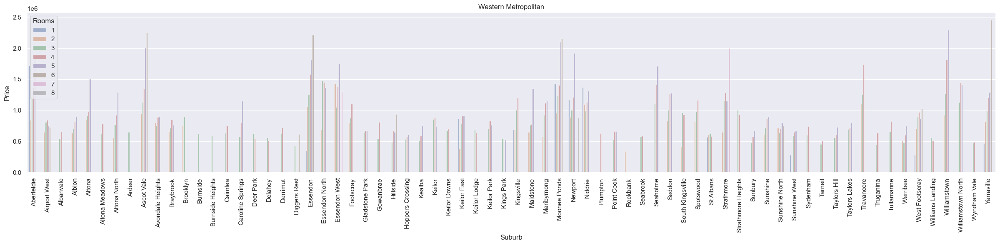

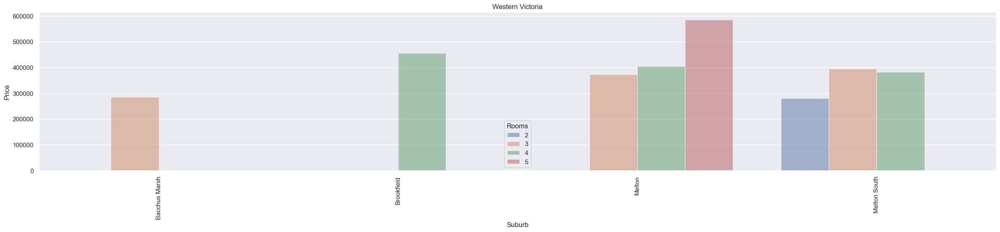

In [62]:
for i in df_room_sub_price['Regionname'].unique():
     get_pricerooms(df_room_sub_price[(df_room_sub_price['Regionname'] == i) & (df_room_sub_price['Type'] == 'h')], i)

### Explain:

### In our previous study, we found that:
### 1. house prices in Melbourne are significantly higher compared to townhouses and units. It is evident that the house type is the primary factor influencing property prices. In this section, through the use of statistical charts, we discovered that there is a positive correlation between the number of rooms and the price of the property, particularly within the range of one to five rooms. The price reaches its peak around four to five rooms and gradually decreases starting from six rooms.

### 2. In the affluent Southern Metropolitan region, the most popular choice is a house with four to five rooms, which also commands a higher average price. And this outcome actully matches the one we mention before. However, in some exclusive neighborhoods of the southern region such as Toorak, Kew, and Hawthorn, houses with six rooms tend to have higher prices. One reason could be the limited availability of houses with six rooms, and another reason is that affluent individuals often desire more rooms to enjoy their luxurious lifestyle. This pattern can also be observed in other suburbs with exceptionally high property prices in different regions.



### One limitation of this chart is that it includes a large amount of data, making it difficult to discern specific details. For instance, we are interested in exploring certain areas, such as East Melbourne, to understand why properties with 2 bedrooms have higher selling prices. To investigate further, we will extract the top ten samples from selected areas for analysis.

In [63]:
def get_top_10_suburb(x):
    df_house_group = df_house.loc[df_house['Regionname'] == x].groupby(['Regionname', 'Suburb']).agg(room_num_count=('Type','count')).reset_index()
    sorted_df_top_10 = df_house_group.sort_values('room_num_count', ascending=False).head(10)
    top_10_suburb = list(sorted_df_top_10['Suburb'])
    top_10 = df_house[df_house['Suburb'].isin(top_10_suburb)].reset_index()
    get_pricerooms(top_10,i)

    

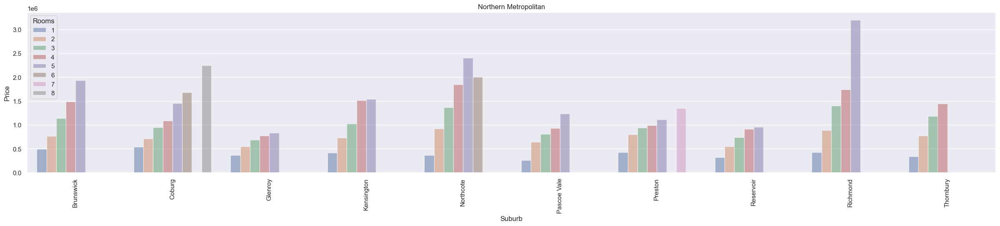

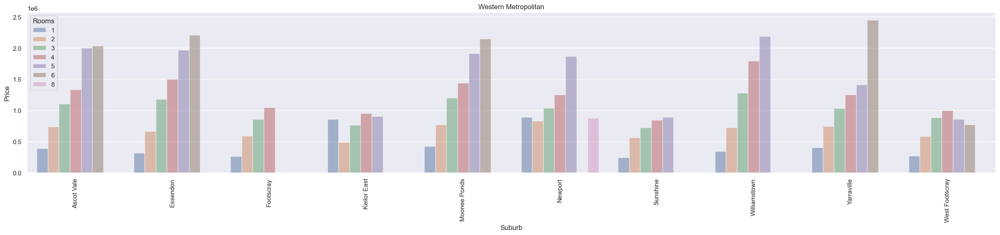

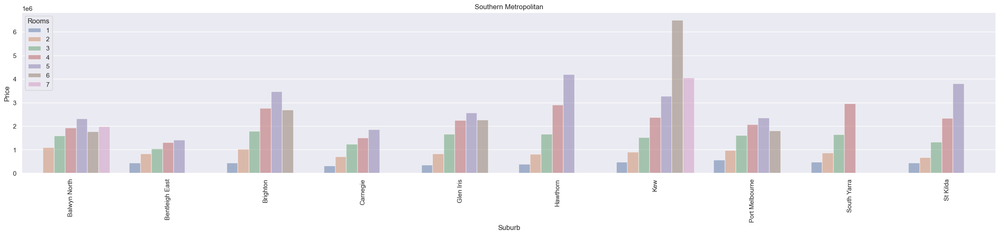

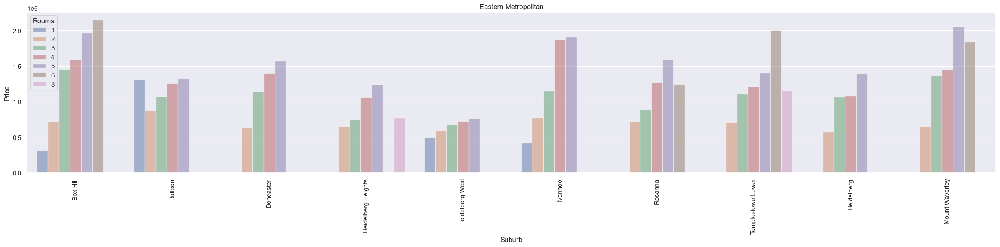

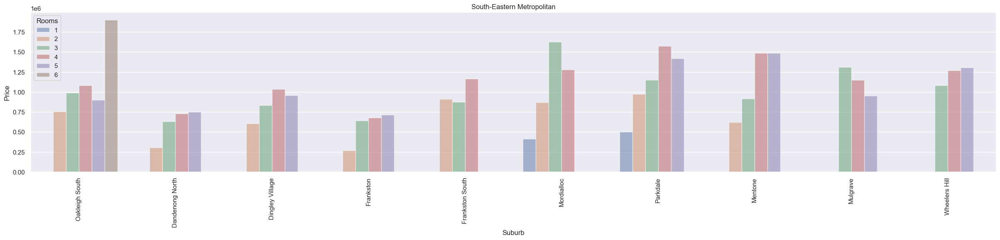

In [64]:
for i in region_list:
    get_top_10_suburb(i)

### By extracting the top ten suburbs in terms of transaction volume from different regions of Greater Melbourne, and obtaining a sufficient sample size, we can observe that property prices do indeed increase with the number of rooms. peaking at five rooms. Properties with more than five rooms are actually quite rare in number.

### Next, we will investigate some regions that have outliers.

#### (1)Coburg:  

In [66]:
df_coburg_1 = df_house.loc[(df_house['Suburb'] == 'Coburg') & (df_house['Rooms'] == 8)]  
df_coburg_1

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
1926,Coburg,35 The Grove,8,u,2250000.0,PI,Peter,2017-03-04,7.8,3058.0,4.0,2.0,4.0,983.0,NaN,NaN,Moreland,-37.7517,144.9699,Northern Metropolitan,11204.0


#### 1. By examining the original data, we can see that there is only one property with eight rooms. Due to the limited sample size, we can speculate that there is a scarcity of properties with eight rooms in Coburg. 
#### 2. Additionally, there are only four properties with a land size in the range of 800-1000. Therefore, when exploring the impact of rooms on property prices, this data has a unique and unrepresentative characteristic due to its rarity.



#### (2) Bulleen

#### In this suburb, the price of properties with one room is significantly higher than those with two rooms, and even comparable to properties with five rooms.

In [67]:
df_bulleen = df_house.loc[(df_house['Suburb'] == 'Bulleen') & (df_house['Rooms'] == 1)]  
df_bulleen

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
10169,Bulleen,43 Robert St,1,h,1310000.0,S,Jellis,2017-05-27,10.8,3105.0,1.0,1.0,1.0,604.0,NaN,1999.0,Manningham,-37.75981,145.08599,Eastern Metropolitan,4480.0


#### This data anomaly is due to inaccurate property information published on the website. This property is actually a townhouse with three rooms.

#### (3) Mulgrave

#### The data in this particular region shows significant differences compared to other areas, as the property prices decrease with an increase in the number of rooms.

In [68]:
df_mulgrave = df_house.loc[df_house['Suburb'] == 'Mulgrave']  

In [69]:
df_mulgrave_count = df_mulgrave.groupby('Rooms').agg(count=('Type','count')).reset_index()

In [70]:
fig_mul = px.pie(df_mulgrave_count, values='count', names='Rooms')
fig_mul.show()

#### There is an interesting phenomenon in this particular region where nearly 65% of the sold properties are three-bedroom homes. This proves that three-bedroom properties are significantly more popular in this area. Through research, it has been discovered that Mulgrave is a highly distinctive region. There are numerous builders who have constructed new townhouses here, particularly after 2010. Mulgrave can be considered a large-scale townhouse development. It is not surprising to find that many young individuals who prefer smaller housing units choose to purchase properties in Mulgrave. This could be a reason why three-bedroom properties are priced higher, as they are relatively newer with shorter construction ages.

### 2.3.3 Land size


In [72]:
##land size
df_landsize_price=df_house
bins = [0,200,500,600,700,800,1000,2000,10000,np.inf]
group_names=['0-200','200-500','500-600','600-700','700-800','800-1000','1000-2000','2000-10000','10000-50000']
group_order = group_names
df_landsize_price['Landsize_group']=pd.cut(df_landsize_price['Landsize'], bins=bins, labels=group_names)

In [73]:
df_landsize_price

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,200-500
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0,200-500
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,800-1000


In [74]:
df_landsize_price['Landsize_group'] = df_landsize_price['Landsize_group'].astype(str)

In [75]:
# df_landsize_price_1 = df_landsize_price.groupby(['Regionname','Suburb','Landsize_group']).agg(('Price', np.median), ('Landsize_group','count')).reset_index()
df_landsize_price = df_landsize_price.groupby(['Regionname','Suburb','Landsize_group']).agg({'Type': 'count', 'Price': np.median}).reset_index()

In [76]:
df_landsize_price = df_landsize_price.rename(columns={'Type': 'Landsize_count'})

In [77]:
def get_lansize_plot(x,i):
    fig, ax = plt.subplots(figsize=(20,5))
    sns.barplot(x='Suburb', y='Price', 
                data=x, 
                hue='Landsize_group', hue_order=group_order, alpha=.5,errorbar=None).set(title=i)
    plt.xticks(rotation=90)
    plt.show()
    sns.set_theme(style="darkgrid")

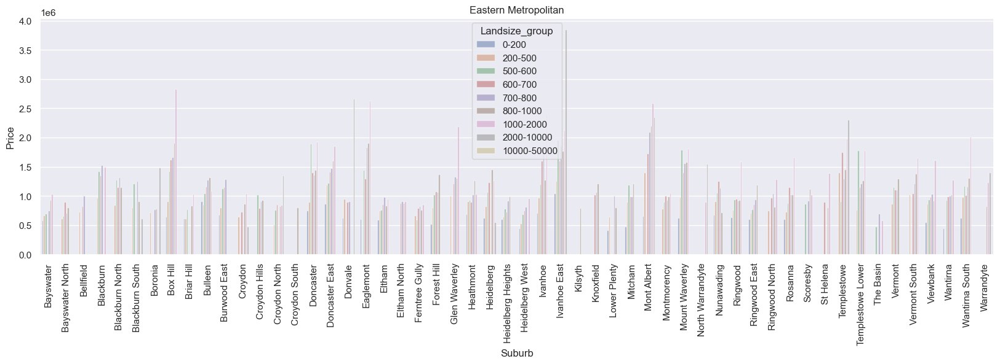

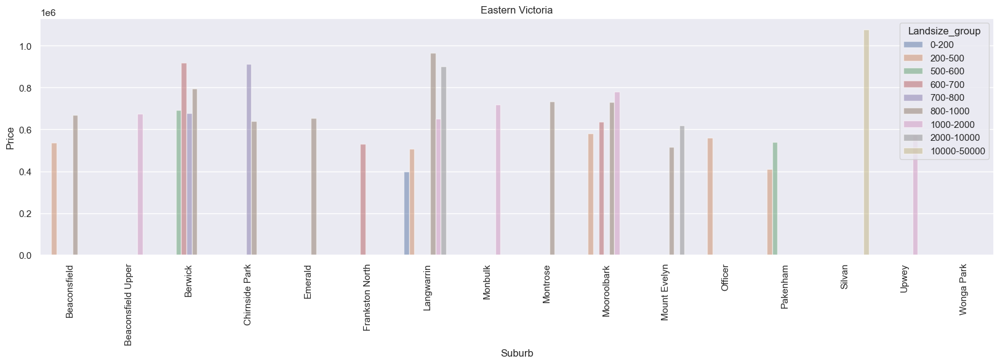

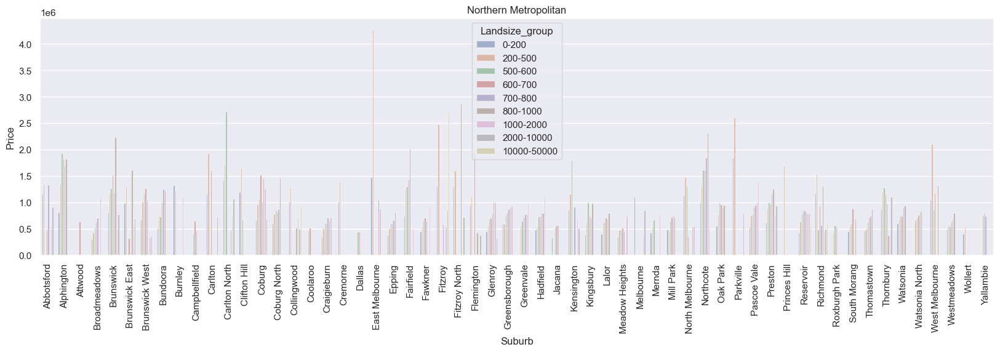

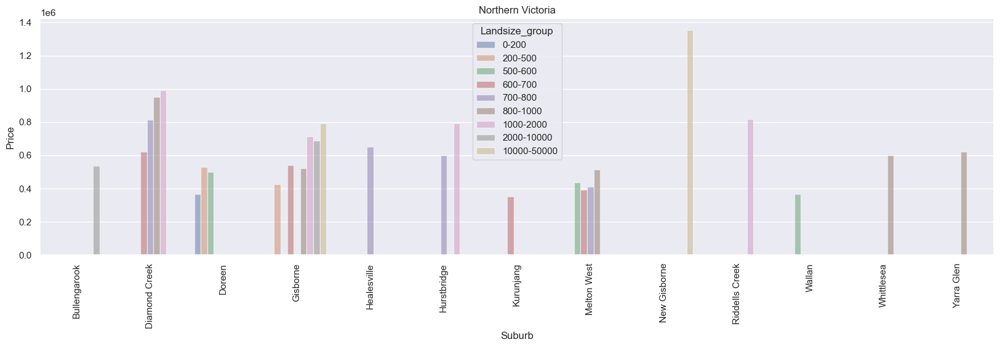

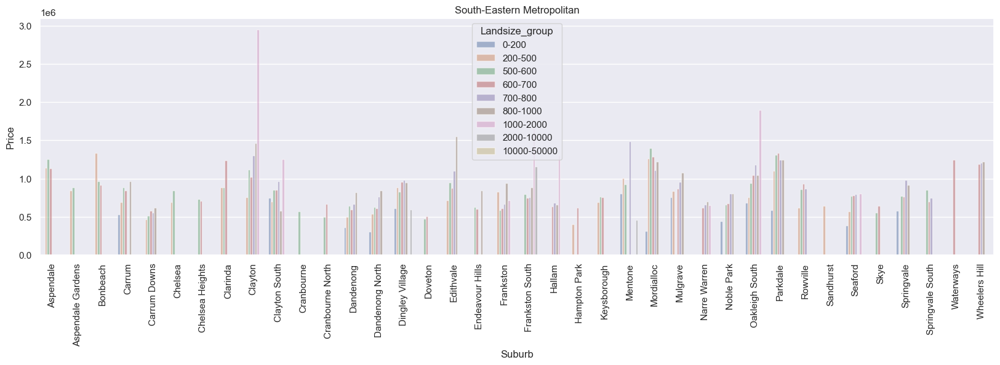

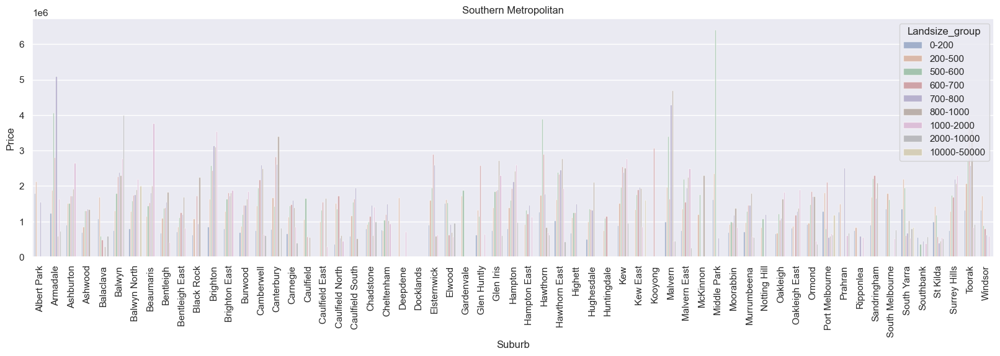

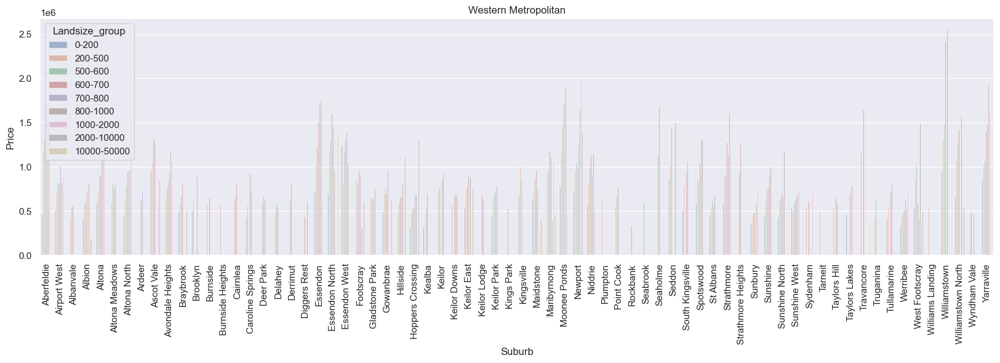

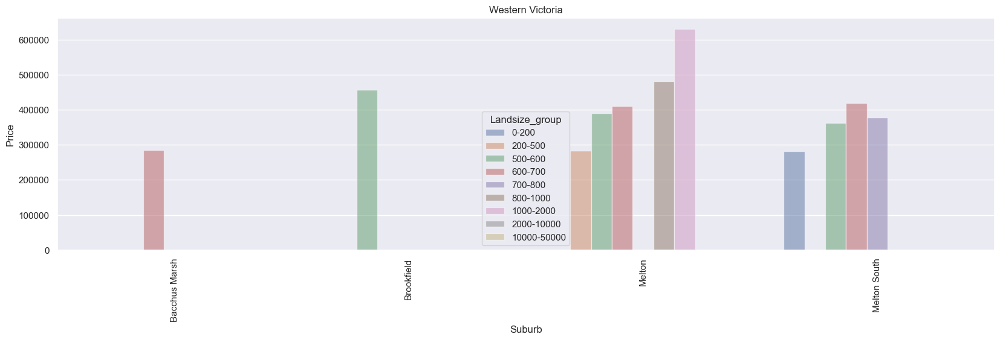

In [78]:
for i in df_landsize_price['Regionname'].unique():
     get_lansize_plot(df_landsize_price[df_landsize_price['Regionname'] == i],i)

#### From the above graph, we can derive a fundamental observation: 
#### The larger the land size, the higher the property price. 
#### To ensure an adequate sample size for a more precise analysis, we will extract the top 10 suburbs in terms of quantity for further study. After partitioning, we discovered that the land size of some units is incorrect, as it was calculated as the total area of the entire building. Therefore, for the next calculation, we will only consider the impact of land size on house prices.



In [79]:
def get_top10_lansize(x):
    df_house_group = df_house.loc[(df_house['Regionname'] == x) & (df_house['Type']=='h')].groupby(['Regionname', 'Suburb']).agg(lansize_count=('Type','count')).reset_index()
    sorted_df_top_10 = df_house_group.sort_values('lansize_count', ascending=False).head(10)
    top_10_suburb = list(sorted_df_top_10['Suburb'])
    top_10 = df_house[df_house['Suburb'].isin(top_10_suburb)].reset_index()
    top_10_h = top_10.loc[top_10['Type'] == 'h']
    get_lansize_plot(top_10_h, x)

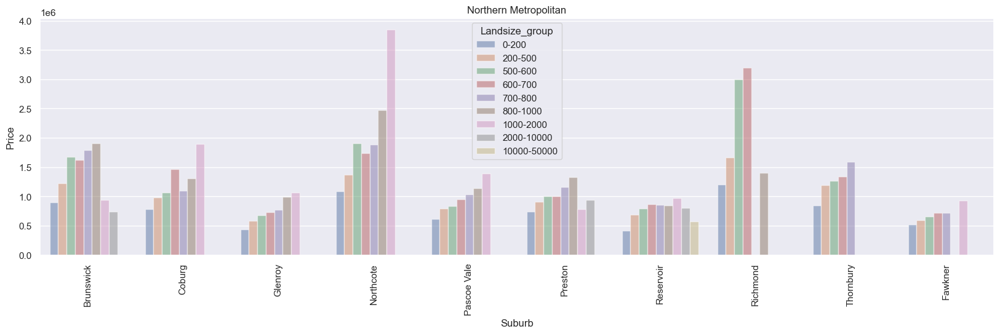

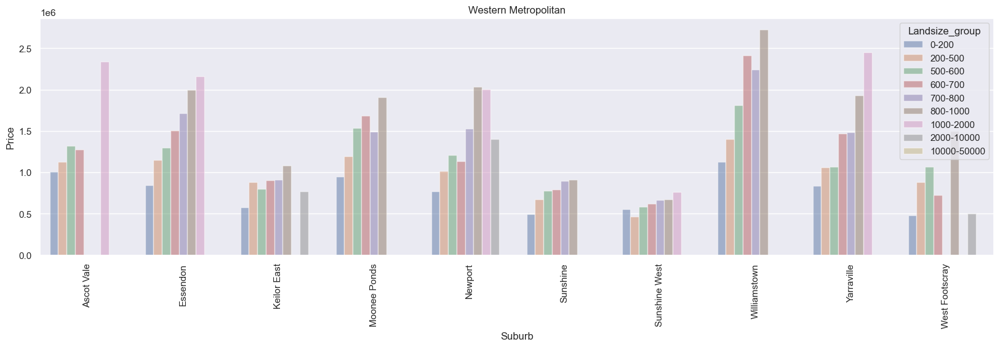

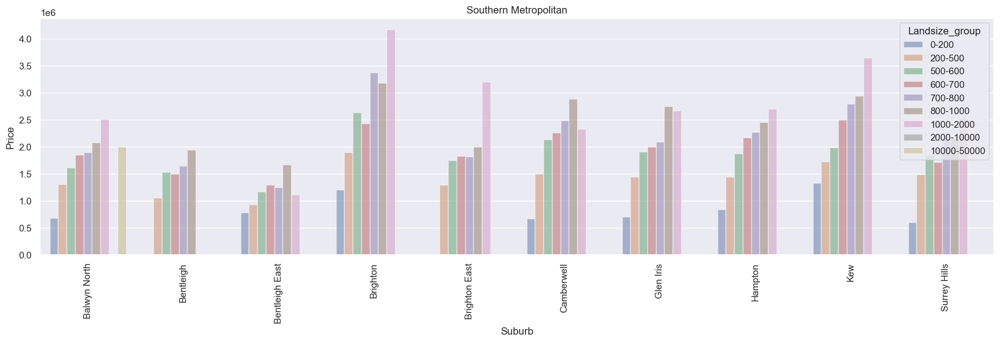

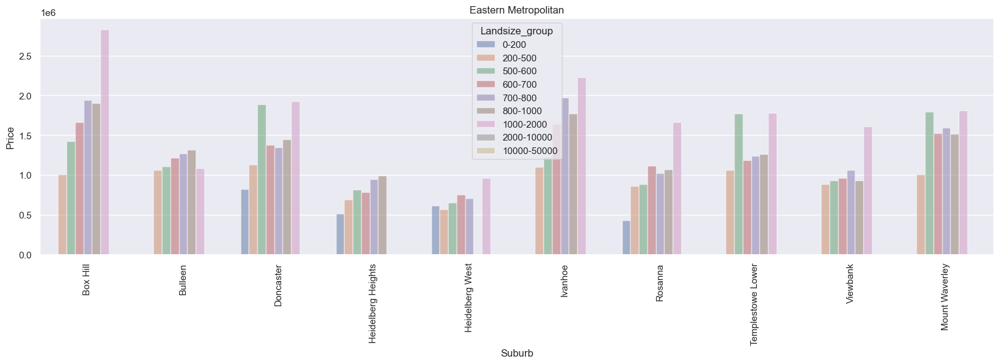

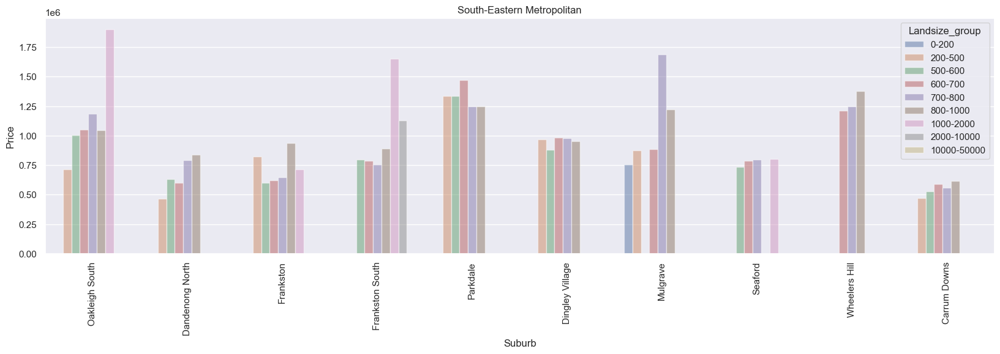

In [80]:
for i in region_list:
    get_top10_lansize(i)

#### Based on the analysis of different areas, it can be observed that: 
### 1. Larger properties are more popular and command higher selling prices. The prices tend to peak zroung 2000 square meters, and properties larger than 2000 square meters show a gradual decline in prices with increasing size. 
### 2. However, there are also exceptions to this trend. Below is the analysis of the areas with anomalous data: 

#### (1) In some areas, smaller-sized properties are more popular, and there may be a lack of properties with large land sizes such as Brunswick, Richmond and Mulgrave

#### (2) Northcote

In [81]:
df_house.loc[(df_house['Type']=='h') & (df_house['Suburb'] == 'Northcote')& (df_house['Landsize_group'] == '1000-2000')]

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
4506,Northcote,215 Clarke St,4,h,3850000.0,PI,Jellis,2016-07-30,5.5,3070.0,4.0,4.0,8.0,1390.0,NaN,1912.0,Darebin,-37.7767,144.9996,Northern Metropolitan,11364.0,1000-2000


In [82]:
df_house.loc[(df_house['Type']=='h') & (df_house['Suburb'] == 'Frankston South')& (df_house['Landsize_group'] == '1000-2000')]

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
10284,Frankston South,641 Nepean Hwy,4,h,1400000.0,SP,U,2017-05-27,38.0,3199.0,4.0,3.0,2.0,1659.0,NaN,1890.0,Frankston,-38.16121,145.10381,South-Eastern Metropolitan,7566.0,1000-2000
12307,Frankston South,30 Grange Rd,4,h,1905000.0,S,Eview,2017-09-03,38.0,3199.0,4.0,2.0,2.0,1471.0,180.0,1960.0,Frankston,-38.15984,145.10884,South-Eastern Metropolitan,7566.0,1000-2000


#### These prominent outliers are mainly caused by the scarcity of properties with sizes exceeding 1000 square meters in these areas. As a result, there are very few transaction records for such properties, rendering these outliers less reliable and representative. Similar situations can be observed in Ascot Vale, Brighton East,Box Hill,Oakleigh South

### (3) Some areas have higher property prices for houses with around 500 landsize such as Doncaster, Templestowe Lower, Mount Waverley. In this area, smaller landsize properties are more popular.

In [83]:
df_house.loc[(df_house['Type']=='h') & (df_house['Suburb'] == 'Mount Waverley')& (df_house['Landsize_group'] == '500-600')]

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
13031,Mount Waverley,7 Huntingtower Cr,4,h,1750000.0,SA,Jellis,2017-08-19,14.2,3149.0,4.0,2.0,2.0,570.0,NaN,NaN,Monash,-37.87655,145.14010,Eastern Metropolitan,13366.0,500-600
13503,Mount Waverley,17 Huntingtower Cr,6,h,1840000.0,S,Jellis,2017-08-26,14.2,3149.0,6.0,2.0,2.0,554.0,368.0,1999.0,Monash,-37.87591,145.13958,Eastern Metropolitan,13366.0,500-600


### 2.3.4 Land area and building area ratio

In [84]:
df_house_region

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,"(1100, 1900]"
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,"(1100, 1900]"
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,"(2010, 2030]"
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.80240,144.99930,Northern Metropolitan,4019.0,"(1900, 1930]"
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,"(1970, 1990]"
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]"
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0,"(1990, 2010]"
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]"


In [85]:
df_house_BA_notnull = df_house_region.loc[~df_house_region['BuildingArea'].isnull()]
df_house_BA_notnull['BuildingArea'].isnull().sum()

0

In [86]:
df_house_BA_notnull['building_ratio'] = df_house_BA_notnull['BuildingArea']/df_house_BA_notnull['Landsize']

In [87]:
df_house_BA_notnull

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category,building_ratio
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,"(1100, 1900]",0.506410
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,"(1100, 1900]",1.119403
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,"(2010, 2030]",1.183333
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.80240,144.99930,Northern Metropolitan,4019.0,"(1900, 1930]",0.857143
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]",0.417969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13572,Watsonia,76 Kenmare St,2,h,650000.0,PI,Morrison,2017-08-26,14.5,3087.0,2.0,1.0,1.0,210.0,79.0,2006.0,Banyule,-37.70657,145.07878,Northern Metropolitan,2329.0,"(1990, 2010]",0.376190
13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,"(1970, 1990]",0.259819
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]",0.399399
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]",0.181293


In [88]:
df_house_BA_notnull

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category,building_ratio
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,"(1100, 1900]",0.506410
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,"(1100, 1900]",1.119403
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,"(2010, 2030]",1.183333
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.80240,144.99930,Northern Metropolitan,4019.0,"(1900, 1930]",0.857143
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]",0.417969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13572,Watsonia,76 Kenmare St,2,h,650000.0,PI,Morrison,2017-08-26,14.5,3087.0,2.0,1.0,1.0,210.0,79.0,2006.0,Banyule,-37.70657,145.07878,Northern Metropolitan,2329.0,"(1990, 2010]",0.376190
13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,"(1970, 1990]",0.259819
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]",0.399399
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]",0.181293


In [89]:
df_house_BA_notnull_1 = df_house_BA_notnull.loc[~(df_house_BA_notnull['building_ratio'] > 1)]
df_house_BA_notnull_1

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category,building_ratio
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,"(1100, 1900]",0.506410
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.80240,144.99930,Northern Metropolitan,4019.0,"(1900, 1930]",0.857143
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]",0.417969
9,Abbotsford,10 Valiant St,2,h,1097000.0,S,Biggin,2016-10-08,2.5,3067.0,3.0,1.0,2.0,220.0,75.0,1900.0,Yarra,-37.80100,144.99890,Northern Metropolitan,4019.0,"(1100, 1900]",0.340909
11,Abbotsford,40 Nicholson St,3,h,1350000.0,VB,Nelson,2016-11-12,2.5,3067.0,3.0,2.0,2.0,214.0,190.0,2005.0,Yarra,-37.80850,144.99640,Northern Metropolitan,4019.0,"(1990, 2010]",0.887850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13572,Watsonia,76 Kenmare St,2,h,650000.0,PI,Morrison,2017-08-26,14.5,3087.0,2.0,1.0,1.0,210.0,79.0,2006.0,Banyule,-37.70657,145.07878,Northern Metropolitan,2329.0,"(1990, 2010]",0.376190
13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,"(1970, 1990]",0.259819
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]",0.399399
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]",0.181293


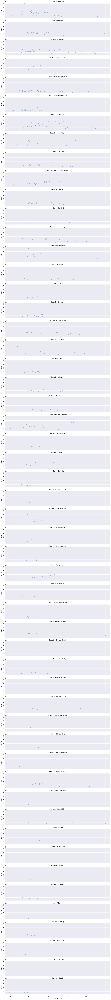

In [90]:
sns.relplot(x='building_ratio',y='Price',
            data=df_house_BA_notnull_1[df_house_BA_notnull_1['Regionname']=='Eastern Metropolitan'],
           kind='scatter', legend="full", row='Suburb', alpha=.5, height=2, aspect=6)

### From this analysis, we can see that the "Landsize and Building area ratio" factor does not have a significant impact on property prices. However, we can still observe some patterns from it:
### 1. The majority of properties have ratios distributed in the range of 0.2 to 0.8. 
### 2. However, for some areas near the Melbourne CBD, such as Fitzroy, Melbourne north, the majority of property ratios are distributed in the >0.8 range. This indicates that the closer an area is to the CBD, the higher the proportion of property to the total land area.
### 3. In some areas that are far from the CBD and have a large amount of bush areas, their ratio is very low, usually lower than 0.5. For example, Mernda and Greensborogh.

### To obtain more accurate results regarding ratios, we will further analyze the top 10 suburbs sold in each region of the city.

In [258]:
df_house_BA_notnull_1

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,YearBuilt_category,building_ratio
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,"(1100, 1900]",0.506410
6,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,4.0,2.0,0.0,245.0,210.0,1910.0,Yarra,-37.80240,144.99930,Northern Metropolitan,4019.0,"(1900, 1930]",0.857143
7,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,2.0,1.0,2.0,256.0,107.0,1890.0,Yarra,-37.80600,144.99540,Northern Metropolitan,4019.0,"(1100, 1900]",0.417969
9,Abbotsford,10 Valiant St,2,h,1097000.0,S,Biggin,2016-10-08,2.5,3067.0,3.0,1.0,2.0,220.0,75.0,1900.0,Yarra,-37.80100,144.99890,Northern Metropolitan,4019.0,"(1100, 1900]",0.340909
11,Abbotsford,40 Nicholson St,3,h,1350000.0,VB,Nelson,2016-11-12,2.5,3067.0,3.0,2.0,2.0,214.0,190.0,2005.0,Yarra,-37.80850,144.99640,Northern Metropolitan,4019.0,"(1990, 2010]",0.887850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13572,Watsonia,76 Kenmare St,2,h,650000.0,PI,Morrison,2017-08-26,14.5,3087.0,2.0,1.0,1.0,210.0,79.0,2006.0,Banyule,-37.70657,145.07878,Northern Metropolitan,2329.0,"(1990, 2010]",0.376190
13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,"(1970, 1990]",0.259819
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,"(1990, 2010]",0.399399
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,"(1900, 1930]",0.181293


In [299]:
def get_top10_ratio_andplot(x):
    df_house_group = df_house_BA_notnull_1.loc[(df_house_BA_notnull_1['Regionname'] == x)].groupby(['Regionname', 'Suburb']).agg(count=('Type','count')).reset_index()
    sorted_df_top_10 = df_house_group.sort_values('count', ascending=False).head(10)
    top_10_suburb = list(sorted_df_top_10['Suburb'])
    top_10 = df_house_BA_notnull_1[df_house_BA_notnull_1['Suburb'].isin(top_10_suburb)].reset_index()
    top_10

    #plot
    g=sns.relplot(x='building_ratio',y='Price',
    data=top_10[top_10['Regionname']==x],
    kind='scatter', legend="full", row='Suburb', alpha=.5, height=2, aspect=6)
    g.fig.suptitle(x)
    plt.show()

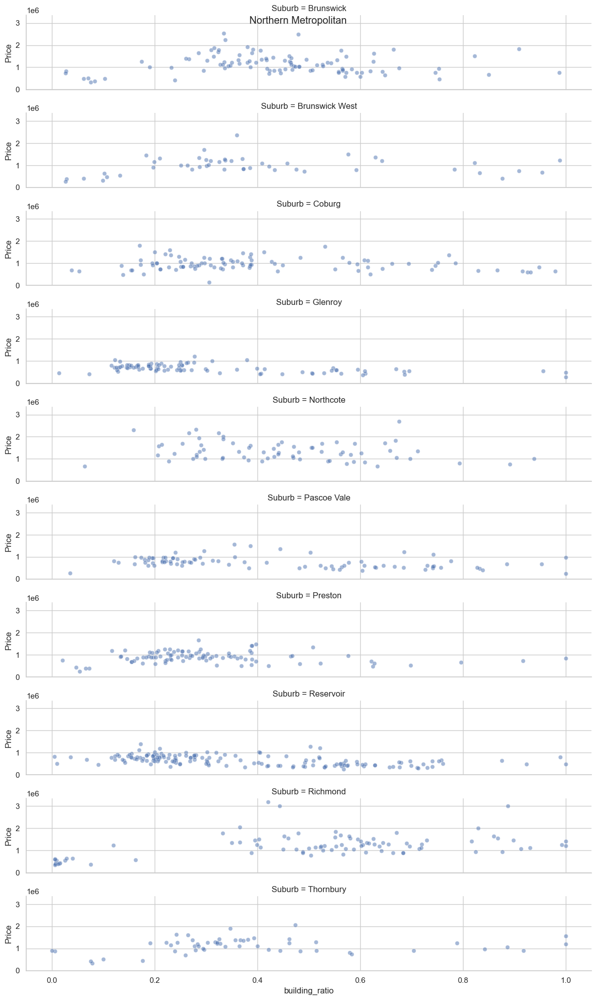

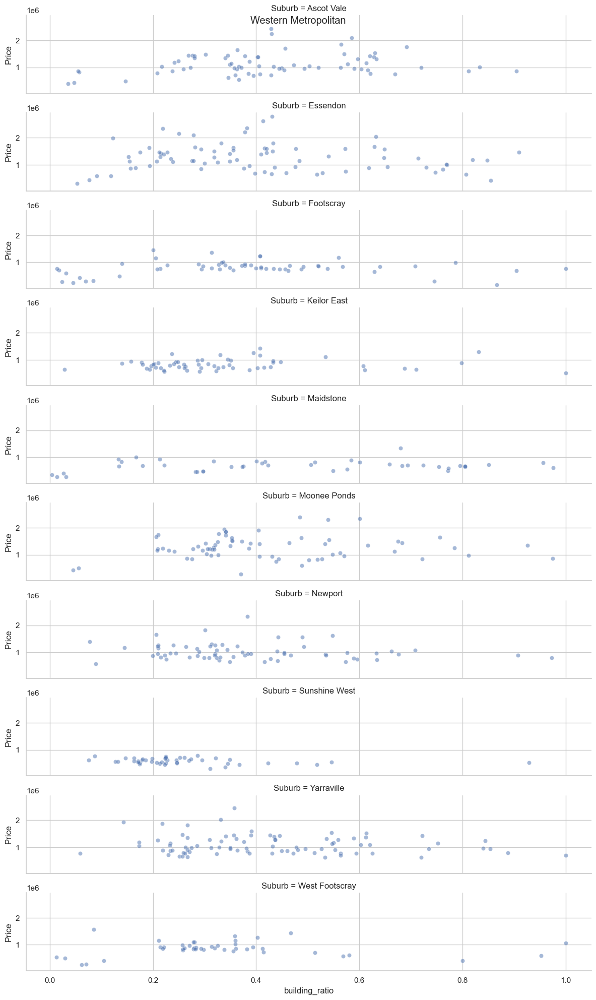

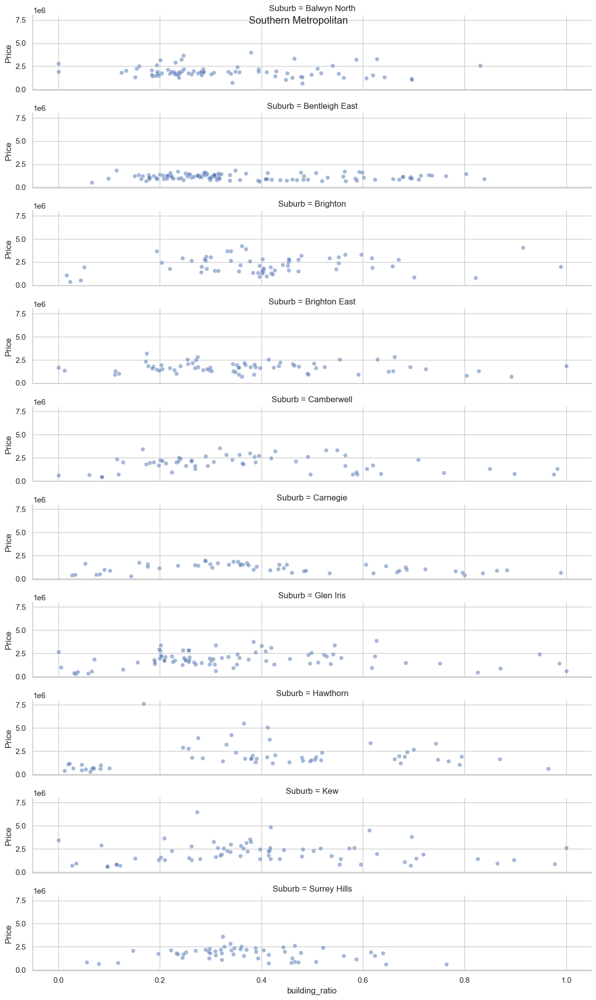

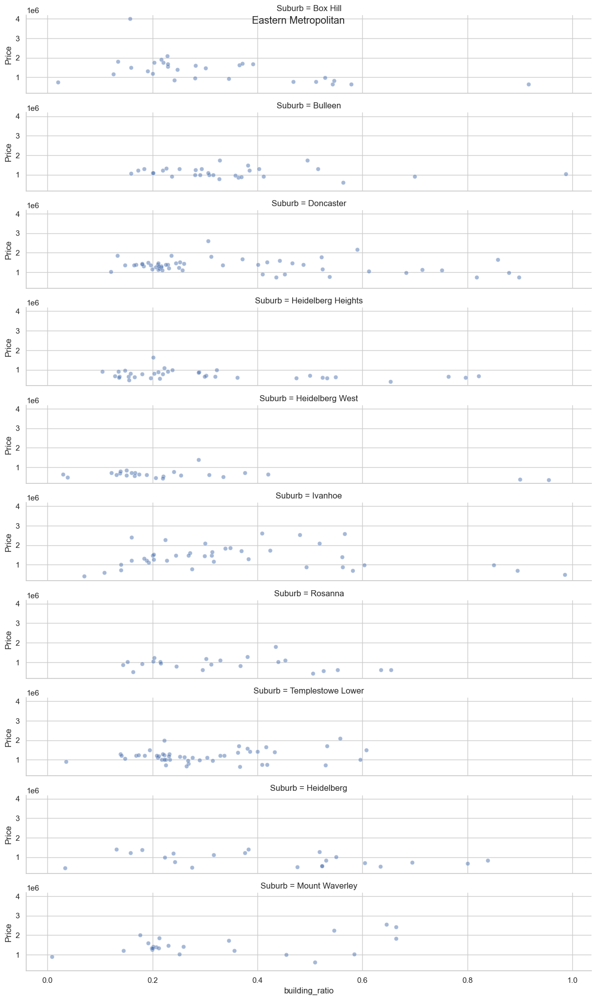

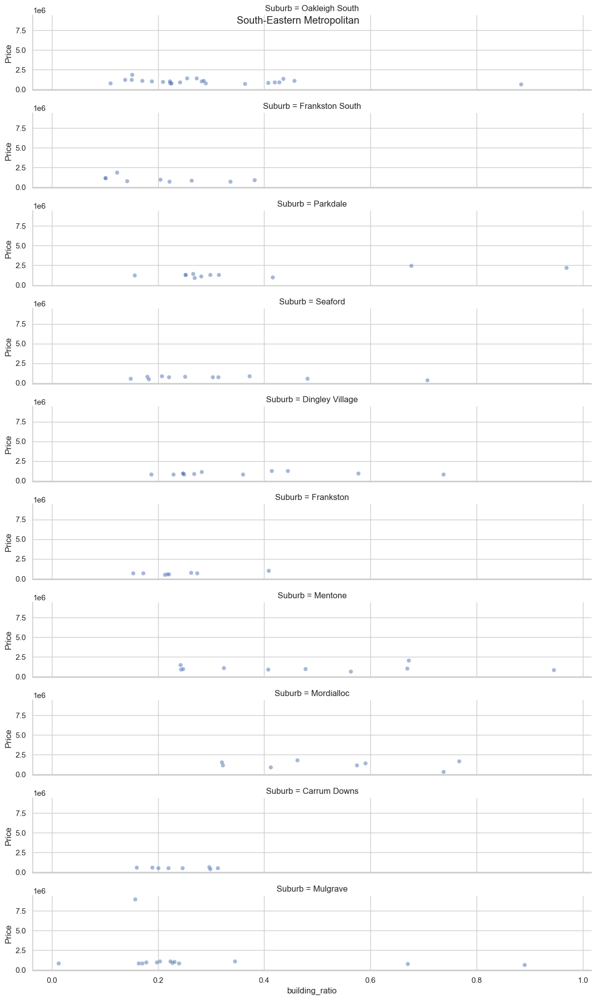

In [379]:
for i in df_house_BA_notnull_1['Regionname'].unique():
    get_top10_ratio_andplot(i)

### After a more comprehensive analysis, the conclusions drawn are generally consistent with the previous findings.

## Section overall

## In exploring the most important price features in real estate, we have discovered several interesting phenomena:

### 1. The house type is the primary determinant of property prices, and it is often closely related to land size. Therefore, we can conclude that larger land sizes in Australia are more desirable and command higher sale prices. However, surprisingly, the size of the garden (the ratio of the building area to the land area) has little impact on property prices. Nonetheless, when the building area ratio exceeds 80%, the prices of such properties tend to be lower compared to those with lower ratios.

### 2. The number of rooms also has a positive impact on property prices, meaning that as the number of rooms increases, the price of the property tends to be higher.

### 3. Another factor that has a relatively smaller impact on property prices is the distance to the central business district (CBD). Contrary to initial expectations, the effect of distance on prices is not as significant. Only when the distance exceeds 20 kilometers from the CBD, the prices tend to decrease with increasing distance.

### 4. Another factor that has a relatively smaller impact on property prices is the distance to the CBD (Central Business District). However, this factor doesn't have as significant of an effect as initially expected. It is observed that prices tend to decrease only when the distance to the CBD exceeds 20 kilometers. However, there are exceptions to this conclusion, as certain areas that are farther from the CBD may have higher prices compared to nearby areas. Therefore, in order to thoroughly investigate the influence of distance, it is necessary to consider it in conjunction with the specific regions or areas.

## 2.4 Selling

## 2.4.1 Sales performance of different real estate agencies.

In [91]:
df_house

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,200-500
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0,200-500
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,800-1000


In [92]:
df_house['SellerG'].unique()

array(['Biggin', 'Nelson', 'Jellis', 'Greg', 'LITTLE', 'Collins', 'Kay',
       'Beller', 'Marshall', 'Brad', 'Maddison', 'Barry', 'Considine',
       'Rendina', 'Propertyau', 'McDonald', 'Prof.', 'Harcourts',
       'hockingstuart', 'Thomson', 'Buxton', 'RT', "Sotheby's", 'Cayzer',
       'Chisholm', 'Brace', 'Miles', 'McGrath', 'Love', 'Barlow',
       'Sweeney', 'Village', 'Jas', 'Gunn&Co', 'Burnham', 'Williams',
       'Compton', 'FN', 'Raine&Horne', 'Hunter', 'Noel', 'Hodges', 'Ray',
       'Gary', 'Fletchers', 'Woodards', 'Raine', 'Walshe', 'Alexkarbon',
       'Weda', 'Frank', 'Stockdale', 'Tim', 'Purplebricks', 'Moonee',
       'HAR', 'Edward', 'Philip', 'RW', 'North', 'Ascend', 'Christopher',
       'Mandy', 'R&H', 'Fletchers/One', 'Assisi', 'One', "O'Brien", 'C21',
       'Bayside', 'Paul', 'First', 'Matthew', 'Anderson', 'Nick',
       'Lindellas', 'Allens', 'Bells', 'Trimson', 'Douglas', 'YPA', 'GL',
       "Tiernan's", 'J', 'Harrington', 'Dingle', 'Chambers', 'Peter',
    

#### To obtain clearer data, we only selected the Greater Melbourne area and the top 20 real estate agencies in terms of sales volume.

In [93]:
df_mel = df_house[df_house['Regionname'].isin(region_list)].reset_index()

In [94]:
df_mel_count = df_mel.groupby('SellerG').agg(sell_count=('Type','count')).reset_index()

In [95]:
df_mel_count

,SellerG,sell_count
0,@Realty,2
1,ASL,4
2,Abercromby's,21
3,Ace,2
4,Alexkarbon,40
...,...,...
257,hockingstuart/Village,1
258,iOne,1
259,iProperty,1
260,iSell,11


In [96]:
sorted_df_mel = df_mel_count.sort_values('sell_count', ascending=False).head(20)

In [97]:
sorted_df_mel

,SellerG,sell_count
152,Nelson,1565
106,Jellis,1316
254,hockingstuart,1149
16,Barry,1006
191,Ray,692
133,Marshall,659
32,Buxton,632
23,Biggin,393
28,Brad,342
249,Woodards,301


In [98]:
df_mel_agent_list = list(sorted_df_mel['SellerG'])

In [99]:
df_mel_agent_list

['Nelson',
 'Jellis',
 'hockingstuart',
 'Barry',
 'Ray',
 'Marshall',
 'Buxton',
 'Biggin',
 'Brad',
 'Woodards',
 'Fletchers',
 'Jas',
 'Greg',
 'McGrath',
 'Sweeney',
 'Noel',
 'Miles',
 'RT',
 'Gary',
 'Harcourts']

In [100]:
df_agent_topk = df_house[df_house['SellerG'].isin(df_mel_agent_list)].reset_index()

In [101]:
df_agent_topk

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
0,0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500
1,1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200
2,2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200
3,3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200
4,4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10226,13570,Wantirna South,34 Fewster Dr,3,h,970000.0,S,Barry,2017-08-26,14.7,3152.0,3.0,2.0,2.0,674.0,NaN,NaN,Knox,-37.88360,145.22805,Eastern Metropolitan,7082.0,600-700
10227,13571,Wantirna South,15 Mara Cl,4,h,1330000.0,S,Barry,2017-08-26,14.7,3152.0,4.0,2.0,2.0,717.0,191.0,1980.0,Knox,-37.86887,145.22116,Eastern Metropolitan,7082.0,700-800
10228,13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,600-700
10229,13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700


In [102]:
df_agent_top_group = df_agent_topk.groupby(['SellerG','Type']).agg(sold_count = ('Type','count')).reset_index()

In [103]:
df_agent_top_group

,SellerG,Type,sold_count
0,Barry,h,820
1,Barry,t,74
2,Barry,u,117
3,Biggin,h,246
4,Biggin,t,27
5,Biggin,u,120
6,Brad,h,243
7,Brad,t,26
8,Brad,u,73
9,Buxton,h,404


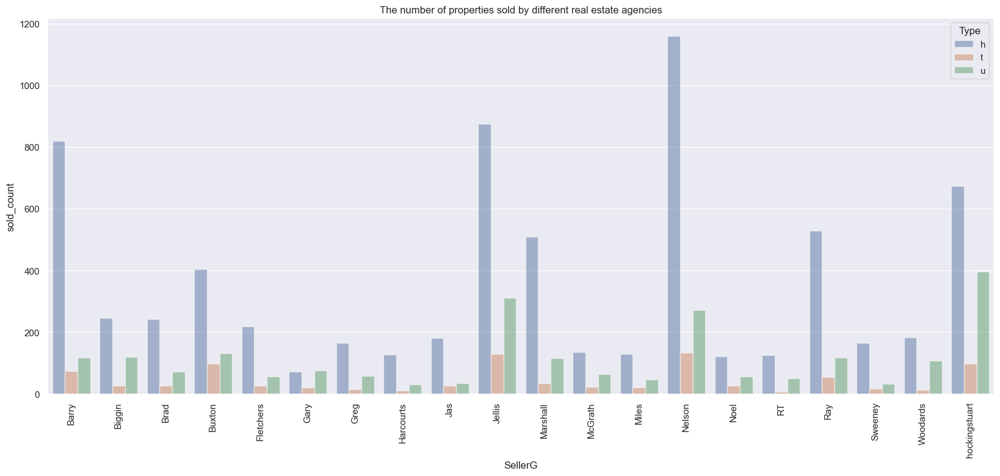

In [104]:
fig, ax = plt.subplots(figsize=(20,8))
sns.set_theme(style="darkgrid")
sns.barplot(x='SellerG', y='sold_count', 
            data=df_agent_top_group, 
            hue='Type', alpha=.5,errorbar=None).set(title='The number of properties sold by different real estate agencies')
plt.xticks(rotation=90)
plt.show()

### There are several agencies that clearly have a significantly higher sales volume.
### 1. Jellis, Nelson and Barry have really good performence in selling house. 
### 2. For townhouse, the best three are Jellis, Nelson and hockingstuart
### 3. For units, same conclusion with townhouse. 

In [105]:
df_topk_price = df_agent_topk.groupby(['SellerG','Type']).agg({'Price':np.median}).reset_index()

In [106]:
df_topk_price

,SellerG,Type,Price
0,Barry,h,830000.0
1,Barry,t,727500.0
2,Barry,u,502000.0
3,Biggin,h,1151750.0
4,Biggin,t,675000.0
5,Biggin,u,548000.0
6,Brad,h,875000.0
7,Brad,t,700000.0
8,Brad,u,465000.0
9,Buxton,h,1323750.0


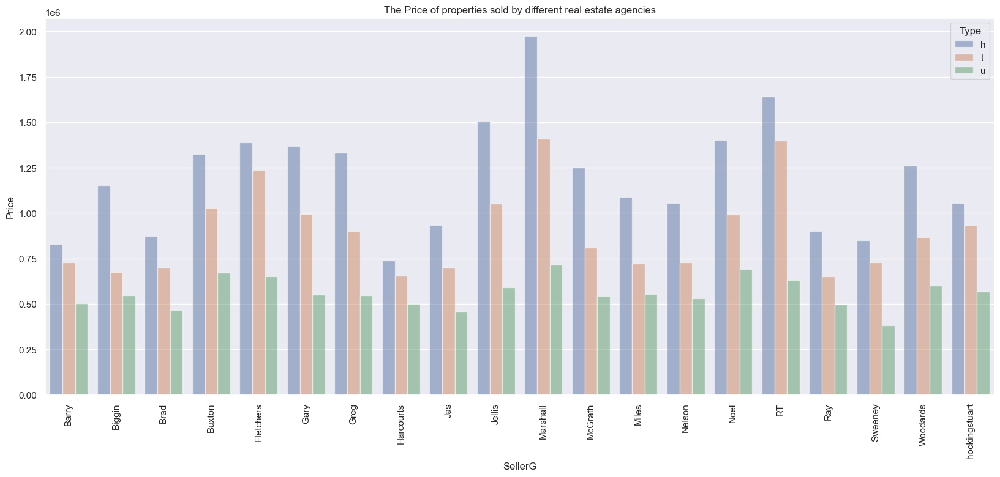

In [107]:
fig, ax = plt.subplots(figsize=(20,8))
sns.set_theme(style="darkgrid")
sns.barplot(x='SellerG', y='Price', 
            data=df_topk_price, 
            hue='Type', alpha=.5,errorbar=None).set(title='The Price of properties sold by different real estate agencies')
plt.xticks(rotation=90)
plt.show()

### When studying the average selling prices, we obtained completely different results. We can see that the top 3 agencies in terms of selling prices are Marshall, RT, and Jellis. From this, we can infer that some agencies focus on achieving high sales volume, while others target higher-end clientele by providing premium services (which may come with higher service fees but result in better selling prices for vendors).

## Next, we will continue our study on the same topic but narrow down the focus to specific suburbs.

In [108]:
df_house_1 = df_house.groupby(['Suburb', 'SellerG']).size().reset_index(name='Count')

In [109]:
df_house_1

,Suburb,SellerG,Count
0,Abbotsford,Beller,1
1,Abbotsford,Biggin,18
2,Abbotsford,Collins,3
3,Abbotsford,Greg,2
4,Abbotsford,Jellis,13
...,...,...,...
2731,Yarraville,Sweeney,18
2732,Yarraville,Village,47
2733,Yarraville,hockingstuart,19
2734,Yarraville,hockingstuart/Village,1


In [110]:
sorted_data = df_house_1.sort_values(['Suburb', 'Count'], ascending=[True, False])

In [111]:
sorted_data

,Suburb,SellerG,Count
1,Abbotsford,Biggin,18
4,Abbotsford,Jellis,13
8,Abbotsford,Nelson,12
2,Abbotsford,Collins,3
10,Abbotsford,hockingstuart,3
...,...,...,...
2727,Yarraville,McGrath,1
2728,Yarraville,Nelson,1
2730,Yarraville,Raine,1
2734,Yarraville,hockingstuart/Village,1


In [112]:
df_agent_top = sorted_data.groupby('Suburb').head(1)

In [113]:
df_agent_top['Suburb'] = df_agent_top['Suburb'].str.upper()

In [114]:
df_agent_top

,Suburb,SellerG,Count
1,ABBOTSFORD,Biggin,18
15,ABERFELDIE,Nelson,20
19,AIRPORT WEST,Barry,23
35,ALBANVALE,Sweeney,2
41,ALBERT PARK,Greg,26
...,...,...,...
2707,WONGA PARK,Morrison,1
2709,WYNDHAM VALE,hockingstuart,3
2710,YALLAMBIE,Barry,10
2718,YARRA GLEN,Buckingham,1


In [118]:
mel_join_1=mel.merge(df_agent_top, left_on='vic_loca_2', right_on='Suburb')

In [119]:
mel_join_1

,id,lc_ply_pid,dt_create,dt_retire,loc_pid,vic_locali,vic_loca_1,vic_loca_2,vic_loca_3,vic_loca_4,vic_loca_5,vic_loca_6,vic_loca_7,geometry,Suburb,SellerG,Count
0,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.31,9627,2012-08-17,NaN,VIC399,2012-10-29,NaN,BUNDOORA,NaN,NaN,G,NaN,2,"POLYGON ((145.02572 -37.71385, 145.02551 -37.7...",BUNDOORA,Ray,17
1,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.32,9628,2012-08-17,NaN,VIC1161,2012-10-29,NaN,HEIDELBERG WEST,NaN,NaN,G,NaN,2,"POLYGON ((145.03327 -37.74889, 145.03577 -37.7...",HEIDELBERG WEST,Barry,16
2,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.44,6584,2011-08-31,NaN,VIC2999,2012-04-27,NaN,DEEPDENE,NaN,NaN,G,NaN,2,"POLYGON ((145.06136 -37.80688, 145.07236 -37.8...",DEEPDENE,Fletchers,1
3,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.57,9757,2013-05-27,NaN,VIC683,2013-08-05,NaN,CROYDON SOUTH,NaN,NaN,G,NaN,2,"POLYGON ((145.29646 -37.81754, 145.29226 -37.8...",CROYDON SOUTH,Barry,1
4,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.60,9759,2013-05-27,NaN,VIC594,2013-08-05,NaN,COBURG NORTH,NaN,NaN,G,NaN,2,"POLYGON ((144.98314 -37.73598, 144.97689 -37.7...",COBURG NORTH,Nelson,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2952,10267,2016-02-26,NaN,VIC2172,2016-05-05,NaN,RINGWOOD EAST,NaN,NaN,G,NaN,2,"POLYGON ((145.25589 -37.79656, 145.26064 -37.8...",RINGWOOD EAST,Barry,3
312,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2964,10669,2017-06-02,NaN,VIC1636,2017-08-09,NaN,MELTON,NaN,NaN,G,NaN,2,"POLYGON ((144.63751 -37.68113, 144.63616 -37.6...",MELTON,Ryder,3
313,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2955,10274,2016-02-26,NaN,VIC2417,2016-05-05,NaN,SYDENHAM,NaN,NaN,G,NaN,2,"POLYGON ((144.75834 -37.68103, 144.76504 -37.6...",SYDENHAM,Purplebricks,2
314,ckan_af33dd8c_0534_4e18_9245_fc64440f742e.2967,10638,2017-06-02,NaN,VIC499,2017-08-09,NaN,CAROLINE SPRINGS,NaN,NaN,G,NaN,2,"POLYGON ((144.74838 -37.75944, 144.74417 -37.7...",CAROLINE SPRINGS,Barry,3


In [329]:
#heat map
fig = px.choropleth_mapbox(mel_join_1, geojson=mel, locations='Suburb', color='SellerG',
                           color_continuous_scale="Viridis",
                           featureidkey="properties.vic_loca_2",
                           # range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=8, center = {"lat": -37.8, "lon": 145},
                           opacity=1,
                           labels={'SellerG':'Seller Agent'},
                           width=2000,
                           height=800
                          )

# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## 2.4.2 As time goes on, how does the sales volume of different agencies change?

In [361]:
df_house_period = df_house

In [362]:
df_house_period['sold_month'] = df_house_period['Date'].dt.to_period('M')

In [363]:
df_house_period['sold_month'] = df_house_period['sold_month'].dt.to_timestamp()

In [364]:
df_house_period

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group,CouncilArea1,sold_month
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,0.0,0.0,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500,Yarra,2016-12-01
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200,Yarra,2016-02-01
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200,Yarra,2017-03-01
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,0.0,0.0,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200,Yarra,2017-03-01
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200,Yarra,2016-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,0.0,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700,Monash,2017-08-01
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,200-500,Hobsons Bay,2017-08-01
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,0.0,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0,200-500,Hobsons Bay,2017-08-01
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,800-1000,Hobsons Bay,2017-08-01


In [371]:
df_house_period_group=df_house_period.groupby(['Regionname', 'Type','sold_month']).size().reset_index(name='sold_p_count')

In [372]:
df_house_period_group

,Regionname,Type,sold_month,sold_p_count
0,Eastern Metropolitan,h,2016-04-01,23
1,Eastern Metropolitan,h,2016-05-01,56
2,Eastern Metropolitan,h,2016-06-01,41
3,Eastern Metropolitan,h,2016-07-01,23
4,Eastern Metropolitan,h,2016-08-01,33
...,...,...,...,...
256,Western Victoria,h,2017-05-01,2
257,Western Victoria,h,2017-06-01,7
258,Western Victoria,h,2017-07-01,16
259,Western Victoria,h,2017-08-01,3


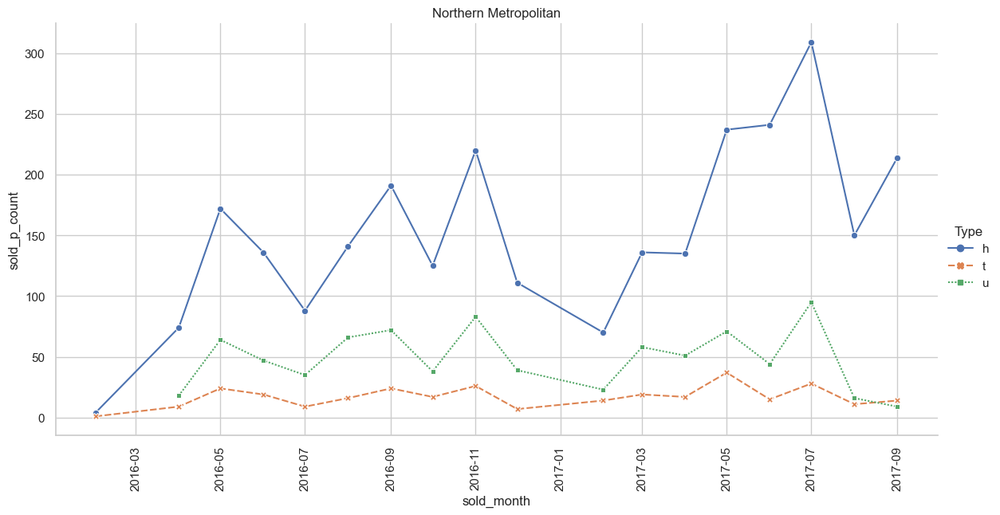

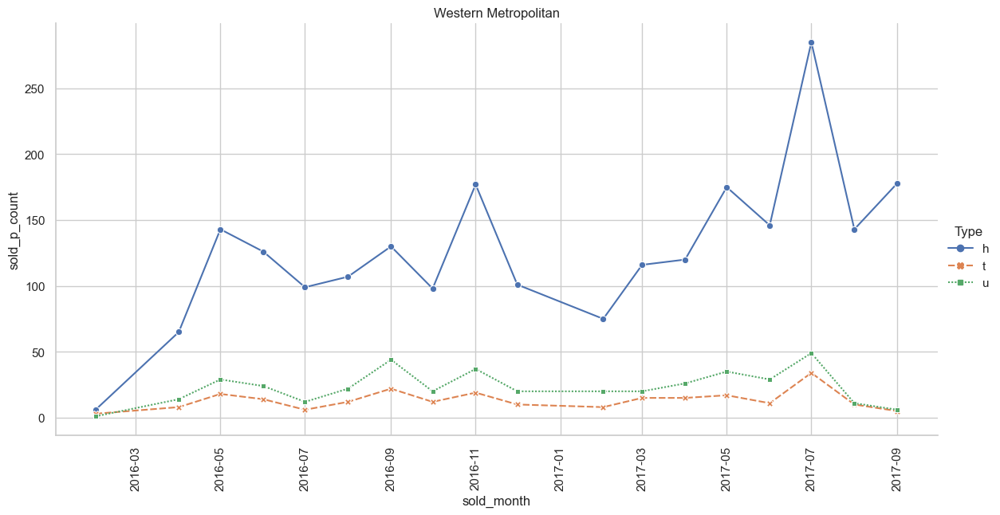

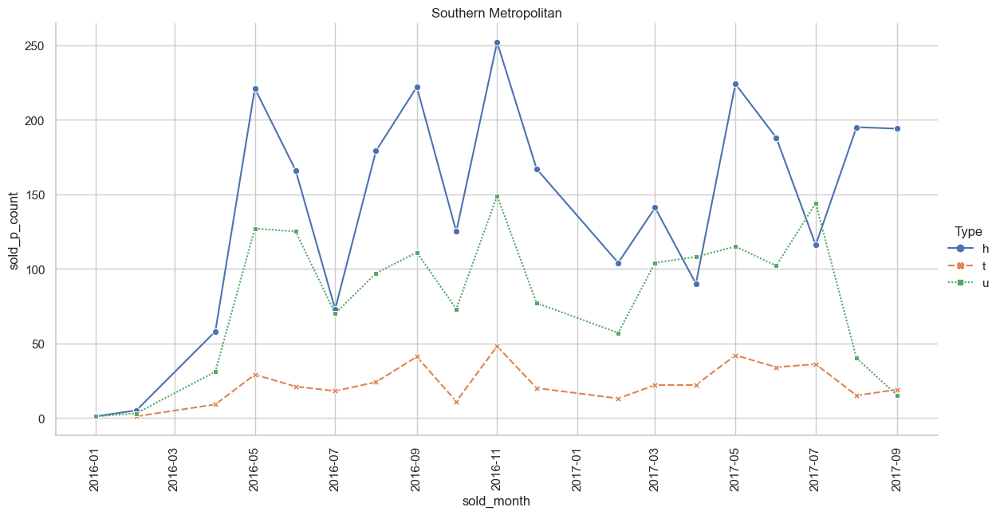

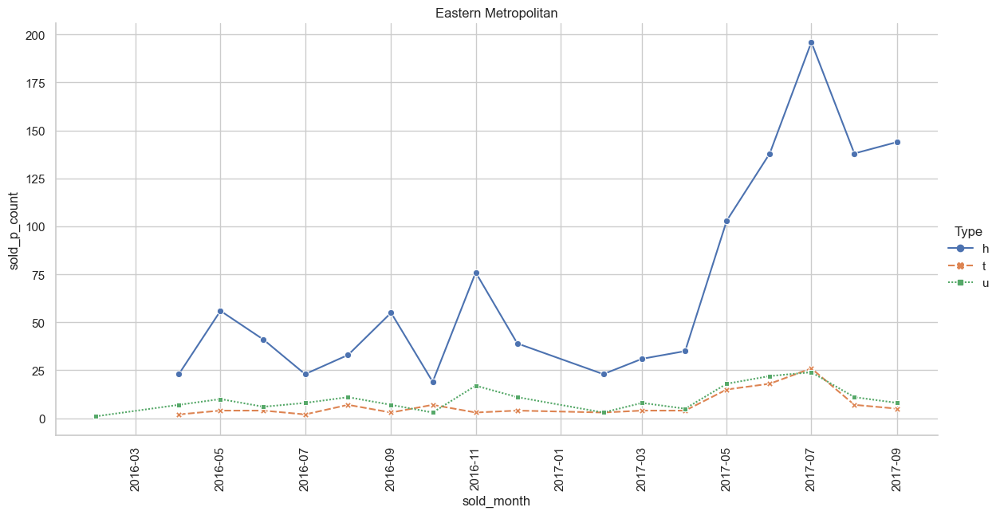

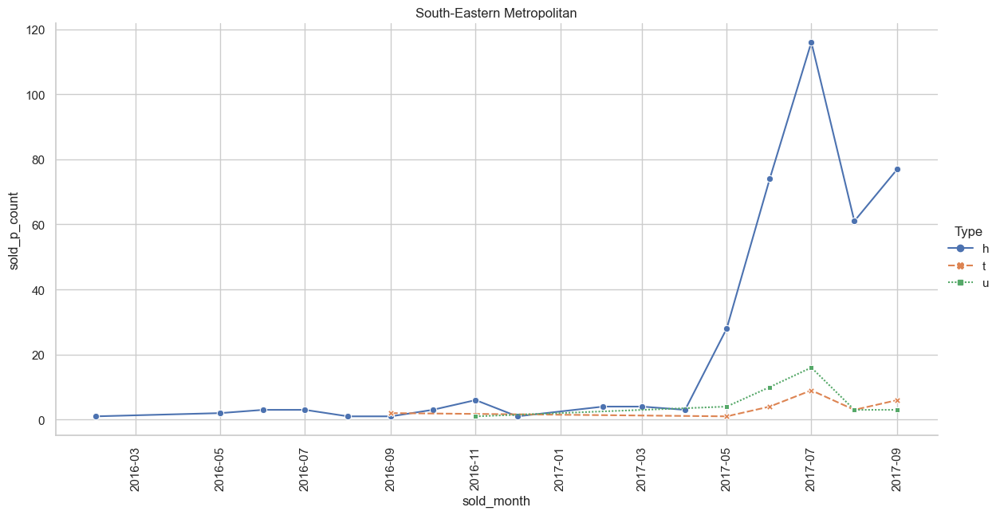

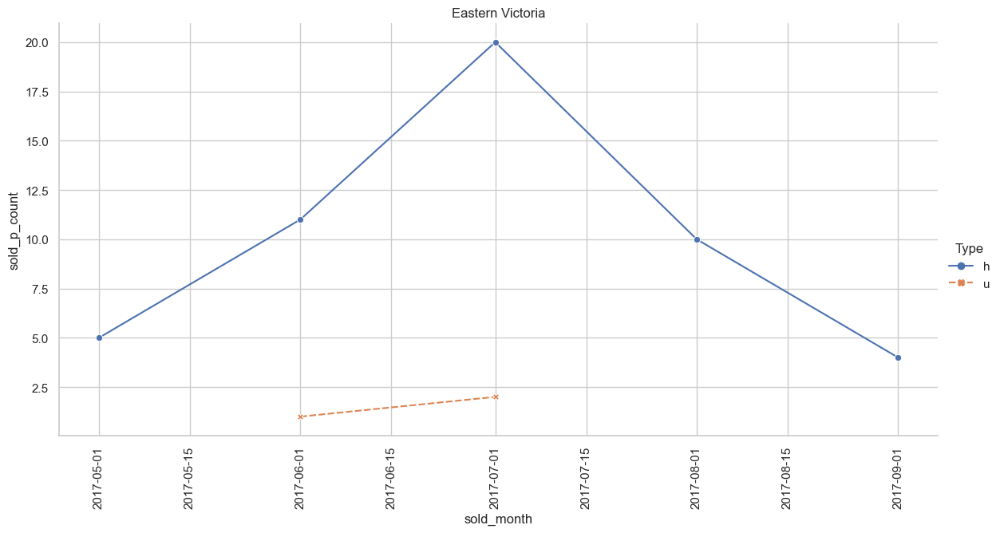

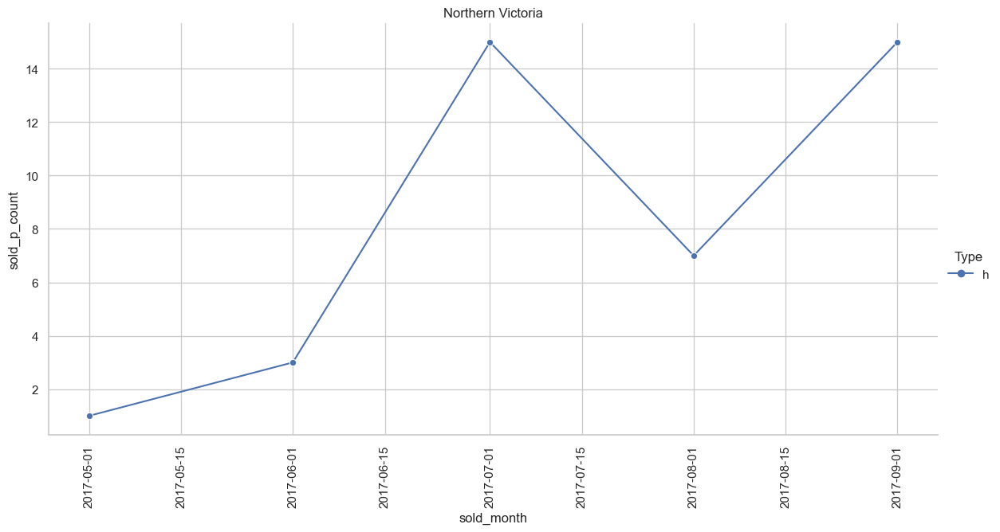

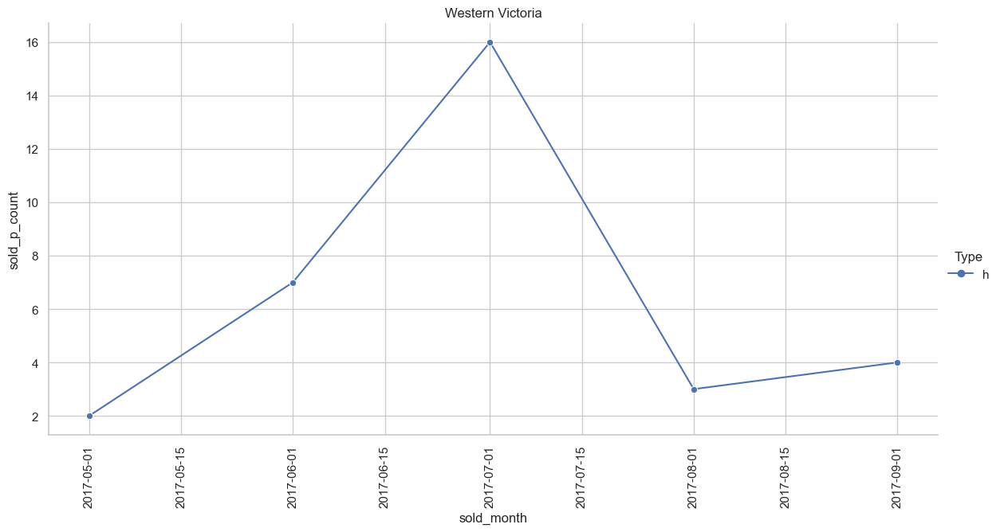

In [378]:
for i in df_house_period['Regionname'].unique():
    sns.set_theme(style="whitegrid")
    sns.relplot(x='sold_month',y='sold_p_count',
                data=df_house_period_group.loc[df_house_period_group['Regionname']==i],
                kind='line',style='Type',hue='Type',markers=True,
                height=6, aspect=2)
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

## From 

In [124]:
df_agent_topk['sold_month'] = df_agent_topk['Date'].dt.to_period('M')

In [125]:
df_agent_topk

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group,sold_month
0,0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500,2016-12
1,1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200,2016-02
2,2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200,2017-03
3,3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200,2017-03
4,4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200,2016-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10226,13570,Wantirna South,34 Fewster Dr,3,h,970000.0,S,Barry,2017-08-26,14.7,3152.0,3.0,2.0,2.0,674.0,NaN,NaN,Knox,-37.88360,145.22805,Eastern Metropolitan,7082.0,600-700,2017-08
10227,13571,Wantirna South,15 Mara Cl,4,h,1330000.0,S,Barry,2017-08-26,14.7,3152.0,4.0,2.0,2.0,717.0,191.0,1980.0,Knox,-37.86887,145.22116,Eastern Metropolitan,7082.0,700-800,2017-08
10228,13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,600-700,2017-08
10229,13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700,2017-08


In [126]:
df_agent_topk['sold_month'] = df_agent_topk['sold_month'].dt.to_timestamp()

In [127]:
df_agent_topk

,index,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group,sold_month
0,0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500,2016-12-01
1,1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200,2016-02-01
2,2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200,2017-03-01
3,3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200,2017-03-01
4,4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200,2016-06-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10226,13570,Wantirna South,34 Fewster Dr,3,h,970000.0,S,Barry,2017-08-26,14.7,3152.0,3.0,2.0,2.0,674.0,NaN,NaN,Knox,-37.88360,145.22805,Eastern Metropolitan,7082.0,600-700,2017-08-01
10227,13571,Wantirna South,15 Mara Cl,4,h,1330000.0,S,Barry,2017-08-26,14.7,3152.0,4.0,2.0,2.0,717.0,191.0,1980.0,Knox,-37.86887,145.22116,Eastern Metropolitan,7082.0,700-800,2017-08-01
10228,13573,Werribee,5 Nuragi Ct,4,h,635000.0,S,hockingstuart,2017-08-26,14.7,3030.0,4.0,2.0,1.0,662.0,172.0,1980.0,Wyndham,-37.89327,144.64789,Western Metropolitan,16166.0,600-700,2017-08-01
10229,13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700,2017-08-01


In [128]:
df_agent_date_count = df_agent_topk.groupby(['SellerG','sold_month','Type']).size().reset_index(name='sold_count')

In [129]:
df_agent_date_count

,SellerG,sold_month,Type,sold_count
0,Barry,2016-02-01,h,1
1,Barry,2016-04-01,h,13
2,Barry,2016-04-01,t,2
3,Barry,2016-04-01,u,1
4,Barry,2016-05-01,h,50
...,...,...,...,...
908,hockingstuart,2017-08-01,h,48
909,hockingstuart,2017-08-01,u,8
910,hockingstuart,2017-09-01,h,55
911,hockingstuart,2017-09-01,t,7


In [159]:
df_agent_date_count['sold_month'].max()

Timestamp('2017-09-01 00:00:00')

In [160]:
def get_agentplot(x,i):
    sns.set_theme(style="darkgrid")
    sns.relplot(x=df_agent_date_count['sold_month'],y='sold_count',
                data=x,
                kind='line',style='SellerG',hue='SellerG',row='Type',markers=True,
                height=5, aspect=3)
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

h


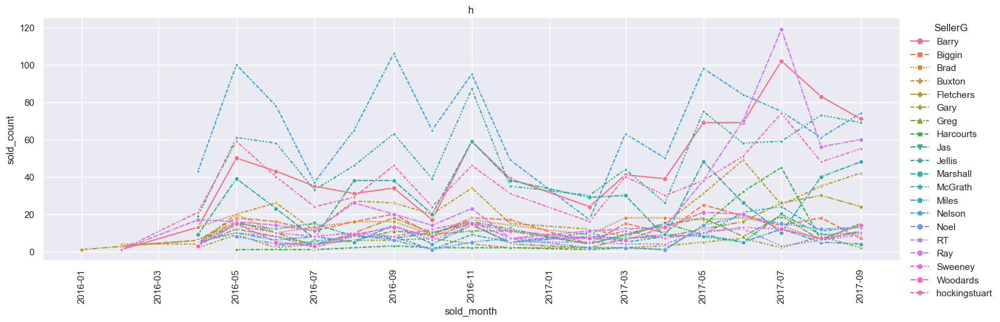

t


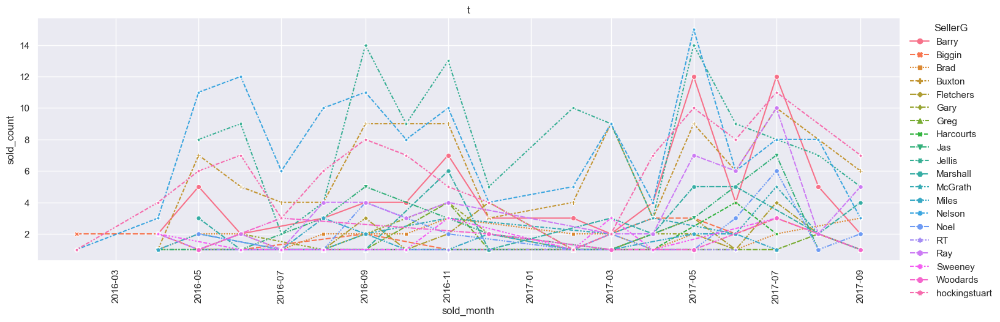

u


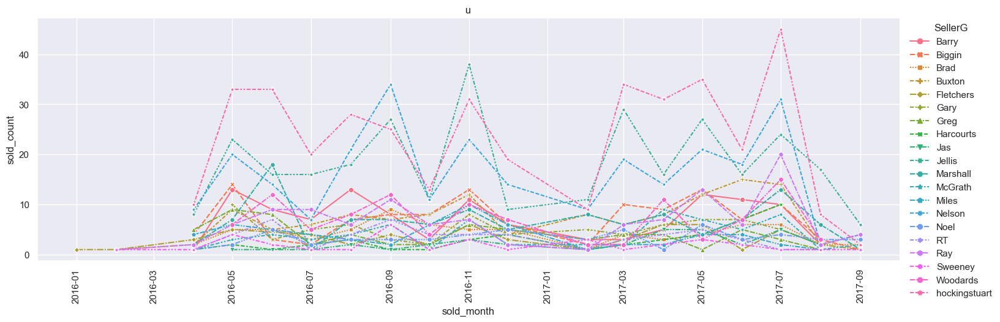

In [161]:
for i in property_type:
    print(i)
    get_agentplot(df_agent_date_count.loc[df_agent_date_count['Type'] == i],i)

#### From this graph, it can be observed that the months of January to March and the period after December are the low seasons for sales.

### 2.4.3 The situation of properties for sale currently in each suburb.

In [124]:
df_house

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Landsize_group
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-03,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.79960,144.99840,Northern Metropolitan,4019.0,200-500
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.80790,144.99340,Northern Metropolitan,4019.0,0-200
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.80930,144.99440,Northern Metropolitan,4019.0,0-200
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-04,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.79690,144.99690,Northern Metropolitan,4019.0,0-200
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.80720,144.99410,Northern Metropolitan,4019.0,0-200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,1245000.0,S,Barry,2017-08-26,16.7,3150.0,4.0,2.0,2.0,652.0,NaN,1981.0,Monash,-37.90562,145.16761,South-Eastern Metropolitan,7392.0,600-700
13576,Williamstown,77 Merrett Dr,3,h,1031000.0,SP,Williams,2017-08-26,6.8,3016.0,3.0,2.0,2.0,333.0,133.0,1995.0,Hobsons Bay,-37.85927,144.87904,Western Metropolitan,6380.0,200-500
13577,Williamstown,83 Power St,3,h,1170000.0,S,Raine,2017-08-26,6.8,3016.0,3.0,2.0,4.0,436.0,NaN,1997.0,Hobsons Bay,-37.85274,144.88738,Western Metropolitan,6380.0,200-500
13578,Williamstown,96 Verdon St,4,h,2500000.0,PI,Sweeney,2017-08-26,6.8,3016.0,4.0,1.0,5.0,866.0,157.0,1920.0,Hobsons Bay,-37.85908,144.89299,Western Metropolitan,6380.0,800-1000


In [315]:
df_house_currentsale = df_house.groupby('Suburb')['Propertycount'].first()
df_house_currentsale = df_house_currentsale.reset_index().rename(columns={'property_count': 'new_property_count'})

In [316]:
df_house_currentsale['Suburb'] = df_house_currentsale['Suburb'].str.upper()

In [328]:
#heat map for current property
fig = px.choropleth_mapbox(df_house_currentsale, geojson=mel, locations='Suburb', color='Propertycount',
                           color_continuous_scale="Viridis",
                           featureidkey="properties.vic_loca_2",
                           # range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=9, center = {"lat": -37.8, "lon": 145},
                           opacity=1,
                           labels={'Propertycount':'Current for sale'},
                           width=2000,
                           height=800)

# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Conclusion